In [511]:
import numpy as np
import matplotlib.pyplot as plt
import sys, os, glob, re
import sklearn
import plotly.plotly as ply
import plotly.graph_objs as go
import plotly.tools as tls
%matplotlib inline  

In [512]:
def percent_reconstruct(eig_vals, ncomp):
    abs_eig = np.fabs(eig_vals)
    norm = np.sum(abs_eig)
    percent = abs_eig / norm
    return np.sum(percent[:ncomp])

def plotly_corner_spec(n):
    sp=[]
    for i in range(1,n):
        l = i*[{}]
        for i in range(n-i-1):
            l.append(None)
        sp.append(l)
    return sp

# Get Data

In [513]:
snid_dir = './allSNIDtemp/'
os.chdir('./allSNIDtemp/')
all_spec = glob.glob('*.lnw')
os.chdir('..')

In [514]:
# Get List of spectra files that are type Ib or Ic

# For some reason, these files do not have a standard organization, which makes it
# stupidly aggravating to load them all. Here we search for spectra of type Ib or Ic
# and find the line number where the wavelength 2501.69 appears (this is the first).
Ib_Ic = []
Ib_Ic_names = []
skiprows = []
SN_type_vec = []
phase_type = []
phases = []
for spec_name in all_spec:
    path = snid_dir + spec_name
    with open(path, 'r') as f:
        lines = f.readlines()
        header = lines[0].split()
        SN_type = int(header[-2])
        SN_sub_type = int(header[-1])
        if ((SN_type == 2) or (SN_type == 3)):
            
            Ib_Ic.append(path)
            Ib_Ic_names.append(spec_name[:-4])
            type_tup = [SN_type, SN_sub_type]
            SN_type_vec.append(type_tup)
            #the first observed wavelength is always 2501.69
            first_wvl = '2501.69'
            for i in range(len(lines)-1):
                line = lines[i]
                if first_wvl in line:
                    skiprows.append(i)
                    phase_row = lines[i-1].split()
                    phase_type.append(int(phase_row[0]))
                    phases.append([float(ph) for ph in phase_row[1:]])
                    break
                    
phase_type = np.array(phase_type)
phases = [np.array(ph) for ph in phases]
SN_type_vec = np.array(SN_type_vec)
Ib_Ic_names = np.array(Ib_Ic_names)

In [515]:
# phase value is the phase, using the definition where phase is number
# of days after max light. This code finds the observed phase closest to 
# the chose phase_value.

phase_value = 15
phase_cols = []
phase_arr = []
for i in range(len(phase_type)):
    idx = (np.abs(phases[i] - phase_value)).argmin()
    phase_cols.append(idx)
    phase_arr.append(phases[i][idx])
print phase_cols
phase_arr = np.array(phase_arr)
#phase_arr[3]=1
#print phase_arr[3]

[6, 14, 7, 0, 0, 0, 4, 4, 7, 1, 6, 2, 0, 5, 0, 0, 0, 4, 0, 6, 5, 0, 1, 4, 7, 2, 0, 0, 0, 20, 9, 4, 6, 1, 14, 0, 1, 5, 0, 5, 7, 5, 12, 0, 2, 0, 7, 24, 4, 7, 0, 1, 15, 8, 4, 0, 22, 0, 12, 0, 7, 2, 0, 2, 2, 0, 11, 0, 3, 0, 2, 5, 13, 0, 3, 1, 23, 14, 7, 0, 0, 13, 0, 4, 0, 0, 1, 3, 7, 1, 0, 3, 19, 16, 0, 3, 2, 5, 4, 2, 2, 2, 0, 0, 5, 0, 0, 7, 0, 7, 1, 4, 1, 14, 1, 0, 0, 2, 0, 1, 7, 1, 2, 3, 2, 8, 1, 5, 1, 0, 5, 1, 0, 6, 16, 4, 2, 0, 0, 3, 0, 23, 0, 0, 19, 1, 4, 5, 0, 10, 0, 0, 0]


(array([  2.,   4.,   3.,   5.,  12.,  28.,  26.,   3.,   0.,   1.]),
 array([ -8.11 ,  -4.199,  -0.288,   3.623,   7.534,  11.445,  15.356,
         19.267,  23.178,  27.089,  31.   ]),
 <a list of 10 Patch objects>)

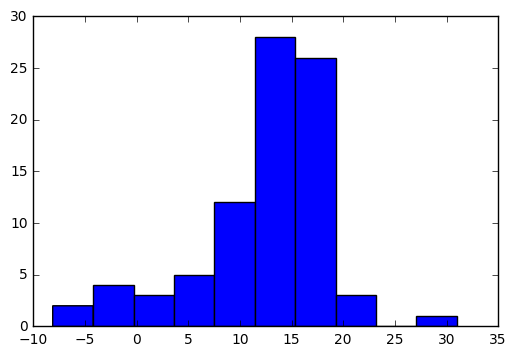

In [516]:
plt.hist(phase_arr[phase_type==0][phase_arr[phase_type==0]>-500])


In [517]:
print "There are %d type Ib and Ic SN"%(len(Ib_Ic))

There are 153 type Ib and Ic SN


In [518]:
# For each spectra, skip all the header lines about removing continuum and load the phase=0
# spectra into a numpy array. Do some data processing like filtering for desired wavelengths and 
# normalizing data.

min_wavelength = 4000
max_wavelength = 7000

spectra = []
for i in range(len(Ib_Ic)):
    spec = Ib_Ic[i]
    skiprow = skiprows[i]
    s = np.loadtxt(spec,skiprows=skiprow, usecols=(0,phase_cols[i]+1)) # Note the +1 because in the SNID files there is a 0/1 phase type
    
    # check that first wvl is 2501.69
    if not(s[0][0] == 2501.69): print 'first wavelength is not 2501.69'
    
    # filter for desired wavelengths
    mask = np.logical_and(s[:,0]>min_wavelength, s[:,0]<max_wavelength)
    s = s[mask]
    spectra.append(s)
    
SN_type_vec = np.array(SN_type_vec)







# Load all phases for specific SN

In [544]:
snid_list = ['sn2009jf', 'sn2007gr', 'sn2004gq']
snid_s_list = []
snid_phase_list = []


for snid in snid_list:
    #snid = 'sn2009jf'
    snid_ind = np.where(Ib_Ic_names==snid)[0][0]
    snid_spec = Ib_Ic[snid_ind]
    snid_skiprows = skiprows[snid_ind]
    snid_s = np.loadtxt(snid_spec, skiprows=snid_skiprows)
    snid_s = snid_s[np.logical_and(snid_s[:,0]<7000,snid_s[:,0]>4000)]
    snid_s = snid_s[:,1:]
    snid_s = snid_s.T
    snid_phases = phases[snid_ind]
    
    snid_s_list.append(snid_s)
    snid_phase_list.append(snid_phases)
    
print snid_phase_list[0]
print 
print snid_phase_list[1]
print
print snid_phase_list[2]

[ -18.   -17.   -16.   -15.   -13.   -11.   -10.   -10.    -9.    -7.    -5.
   -4.    -3.    -2.    -1.     0.     1.     1.     3.     3.     7.     9.
   11.    18.    24.    25.    27.    30.    31.    33.    34.    46.6
   48.6   54.6   58.5   60.5   66.5   70.4   80.3   81.3   82.3   95.2
  224.2  240.   246.   349.2  356.1  388.8]

[ -9.  -8.  -6.  -5.  -4.  -3.   0.   5.   7.   8.   9.  10.  13.  14.  15.
  16.  17.  20.  25.  42.  45.  47.  49.  53.  53.]

[ -9.00000000e+00  -8.10000000e+00  -7.10000000e+00  -6.10000000e+00
  -5.10000000e+00  -2.10000000e+00  -1.10000000e+00  -1.00000000e-01
   1.58000000e+01   1.68000000e+01   1.78000000e+01   2.08000000e+01
   2.08000000e+01   2.47000000e+01   4.16000000e+01   5.46000000e+01
   6.95000000e+01   7.25000000e+01   7.84000000e+01   8.44000000e+01
   8.93000000e+01   2.89100000e+02   3.35800000e+02   3.43800000e+02]


In [536]:
print snid_s
print snid_s.shape

[[ 0.028  0.001  0.018 ..., -0.001  0.01   0.016]
 [-0.005 -0.007  0.004 ..., -0.002 -0.017  0.026]
 [-0.001 -0.002  0.041 ...,  0.003  0.018  0.006]
 ..., 
 [ 0.     0.     0.    ..., -0.277 -0.146 -0.16 ]
 [ 0.     0.     0.    ...,  0.021  0.007  0.042]
 [ 0.     0.     0.    ...,  0.239  0.26  -0.186]]
(24, 414)


In [521]:
print snid_phases
print snid_phases.shape

[ -18.   -17.   -16.   -15.   -13.   -11.   -10.   -10.    -9.    -7.    -5.
   -4.    -3.    -2.    -1.     0.     1.     1.     3.     3.     7.     9.
   11.    18.    24.    25.    27.    30.    31.    33.    34.    46.6
   48.6   54.6   58.5   60.5   66.5   70.4   80.3   81.3   82.3   95.2
  224.2  240.   246.   349.2  356.1  388.8]
(48,)


In [545]:
use09jf = [-18, -15, -9, -5, 0, 7, 11, 18, 30, 46.6, 95.2]
use07gr = [-9, -5, 0, 5, 10, 15, 20, 25, 42, 45, 49]
use04gq = [-9, -5.1, -1.1, -0.1, 15.8, 17.8, 24.7, 41.6, 54.6]
use = [use09jf, use07gr, use04gq]

#phase_mask = np.array([ph in use for ph in snid_phases])

In [523]:
phase_mask

array([ True, False, False,  True, False, False, False, False,  True,
       False,  True, False, False, False, False,  True, False, False,
       False, False,  True, False,  True,  True, False, False, False,
        True, False, False, False,  True, False, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False], dtype=bool)

In [546]:
for i,snid_s in enumerate(snid_s_list):
    phase_mask = np.array([ph in use[i] for ph in snid_phase_list[i]])
    snid_s_list[i] = snid_s[phase_mask]
    snid_phases = snid_phase_list[i]
    snid_phase_list[i] = snid_phases[phase_mask]
print snid_phase_list
for snid_s in snid_s_list: print snid_s.shape

[array([-18. , -15. ,  -9. ,  -5. ,   0. ,   7. ,  11. ,  18. ,  30. ,
        46.6,  95.2]), array([ -9.,  -5.,   0.,   5.,  10.,  15.,  20.,  25.,  42.,  45.,  49.]), array([ -9. ,  -5.1,  -1.1,  -0.1,  15.8,  17.8,  24.7,  41.6,  54.6])]
(11, 414)
(11, 414)
(9, 414)


In [358]:
print snid_phases.shape
print snid_phases
print snid_phases.shape

(11,)
[-18.  -15.   -9.   -5.    0.    7.   11.   18.   30.   46.6  95.2]
(11,)


In [547]:
#Normalize an NxM matrix, where N is the number of spectra, 
#and M is the dimension of each wavelength (ie number of wavelength bins)

def normalize(spec_mat):
    for i in range(spec_mat.shape[0]):
        spec_mat[i][spec_mat[i]==0] = np.nan
        
    spectra_mean = np.nanmean(spec_mat, axis=1)
    spectra_std = np.nanstd(spec_mat, axis=1)
    spec_matT = (spec_mat.T - spectra_mean)/spectra_std
    spec_mat = spec_matT.T
    return spec_mat


def rebin(spec_mat, smoothing, wvl=None):

    nrows, ncols = spec_mat.shape
    tmp = np.reshape(spec_mat,(nrows, ncols/smoothing, smoothing))
    spec_mat = np.nanmean(tmp, axis=2)
    print spec_mat.shape
    
    if wvl!=None:
        wvrows = wvl.shape[0]
        wvcols = 1
        wvtemp = np.reshape(wvl, (wvrows/smoothing,1,smoothing))
        print wvtemp.shape
        wvl = np.nanmean(wvtemp, axis=2)
        print wvl.shape
    if wvl!=None:
        return spec_mat, wvl
    else:
        return spec_mat

    

In [548]:
for i,snid_s in enumerate(snid_s_list):
    snid_s_list[i] = normalize(snid_s)

In [361]:
print snid_s
print snid_s.shape

[[ 1.1784325   0.66232522  0.27524475 ...,  0.21331188 -0.0757082
   0.13073471]
 [ 1.06076001  0.78233632  0.5213141  ...,  0.10367856  0.02827214
   0.03987313]
 [        nan         nan         nan ..., -0.11243371  0.09426866
   0.08338959]
 ..., 
 [ 1.79164197  1.87708197  1.97257372 ...,  0.01750561 -0.10311556
  -0.11819321]
 [ 1.63638277  2.54358017 -0.92942805 ...,  0.1152235  -0.18259383
  -0.32462978]
 [ 1.45687866  0.58365007  1.23250743 ..., -0.0379189  -0.56549451
  -0.55639838]]
(11, 414)


In [549]:
for i,snid_s in enumerate(snid_s_list):
    snid_s_list[i] = rebin(snid_s, smoothing=2)

for snid_s in snid_s_list: print snid_s.shape

(11, 207)
(11, 207)
(9, 207)
(11, 207)
(11, 207)
(9, 207)


In [550]:
for i,snid_s in enumerate(snid_s_list):

    big_gap_mask = np.array([np.isnan(spec).any() for spec in snid_s])
    print 'total number of bad spectra = %d'%(np.sum(big_gap_mask))
    snid_s_list[i] = snid_s[np.invert(big_gap_mask)]
    snid_phases = snid_phase_list[i]
    snid_phase_list[i] = snid_phases[np.invert(big_gap_mask)]

total number of bad spectra = 1
total number of bad spectra = 0
total number of bad spectra = 1


In [364]:
snid_s = snid_s[np.invert(big_gap_mask)]
snid_phases = snid_phases[np.invert(big_gap_mask)]

In [365]:
print snid_s.shape
print snid_phases.shape

(10, 207)
(10,)


In [551]:
for snid_s in snid_s_list: print snid_s.shape
for snid_ph in snid_phase_list: print snid_ph.shape

(10, 207)
(11, 207)
(8, 207)
(10,)
(11,)
(8,)


In [552]:
snid_s_list

[array([[ 0.92037886,  0.26234207, -0.28989272, ...,  0.11267096,
          0.06880184,  0.02751326],
        [ 0.92154817,  0.45750867,  0.2051872 , ...,  0.01667115,
          0.09787806,  0.03407263],
        [ 1.20710158,  0.63534625,  0.24894017, ..., -0.15631498,
         -0.09348473,  0.02275125],
        ..., 
        [ 1.83436197,  1.84441373,  1.67604668, ...,  0.10043266,
         -0.0076238 , -0.11065438],
        [ 2.08998147, -0.67284697, -0.45062942, ..., -0.26506632,
         -0.03826697, -0.25361181],
        [ 1.02026437,  1.40988199,  1.42201016, ..., -0.43056857,
         -0.29109455, -0.56094645]]),
 array([[ 0.57932284,  0.22062933, -0.02691971, ..., -0.59779811,
         -1.3808614 , -0.9766997 ],
        [ 1.37278341,  1.07098238,  0.59033629, ..., -0.37840777,
         -0.37840777, -0.49763781],
        [ 1.95108741,  1.43383041,  0.92757888, ..., -0.29953082,
         -0.40408277, -0.43985054],
        ..., 
        [ 0.75000197,  1.03370152,  1.50838836, ...,

In [553]:
# Organize spectra in an (N x M) array, where N is the number of spectra, and M is the dimensionality
# (ie number of data points in spectrum) of a spectrum. We treat each wavelength as independent
# and zero the means and unify the standard deviations.

wavelengths = np.array(spectra[0][:,0])
spectra_matrix = np.ndarray((len(spectra),spectra[0].shape[0]))
for i, spec in enumerate(spectra):
    spectra_matrix[i,:] = spec[:,1]
    
#spectra_mean = np.mean(spectra_matrix, axis=1)
#spectra_std = np.std(spectra_matrix, axis=1)



In [554]:
phase_range = np.logical_and(phase_arr>10, phase_arr<20)
phase_mask = np.logical_and(phase_type==0, phase_range)
#phase_mask = phase_type==0
print len(phase_mask)
print spectra_matrix.shape

phase_cols = np.array(phase_cols)
phase_cols = phase_cols[phase_mask]
skiprows = np.array(skiprows)
skiprows = skiprows[phase_mask]

spectra_matrix[phase_mask].shape
spectra_matrix = spectra_matrix[phase_mask]
SN_type_vec = SN_type_vec[phase_mask]
phase_arr = phase_arr[phase_mask]
Ib_Ic_names = Ib_Ic_names[phase_mask]
print SN_type_vec.shape
print spectra_matrix.shape
print Ib_Ic_names.shape

153
(153, 414)
(59, 2)
(59, 414)
(59,)


In [555]:
IcBLmask = np.array([np.array_equal(arr, np.array([3,4])) for arr in SN_type_vec])

In [451]:
SN_type_vec[IcBLmask]

array([[3, 4],
       [3, 4],
       [3, 4],
       [3, 4],
       [3, 4],
       [3, 4],
       [3, 4],
       [3, 4],
       [3, 4],
       [3, 4],
       [3, 4],
       [3, 4],
       [3, 4],
       [3, 4],
       [3, 4]])

In [370]:
import pidly
idl = pidly.IDL()
idl('.COMPILE type default lmfit linear_fit powerlaw_fit integ binspec SNspecFFTsmooth')


% Compiled module: TYPE.
% Compiled module: DEFAULT.
% Compiled module: LMFIT.
% Compiled module: LINEAR_FIT.
% Compiled module: POWERLAW.
% Compiled module: POWERLAW_FIT.
% Compiled module: INTEG.
% Compiled module: BINSPEC.
% Compiled module: SNSPECFFTSMOOTH.


In [14]:
spectra_matrix[IcBLmask].shape

(15, 414)

In [15]:
!ls

2010ay_pca_values.npy	   gaussian.avi      README.md
allSNIDtemp		   Ib_subtype.ipynb  tmp_spec.txt
apjaa2759t3_mrt.txt	   PCA_Ib_Ic.ipynb   Untitled.ipynb
CfAspectraPCA.ipynb	   PCvsTemplates     wavelengths_phase15pm5.npy
eigen_spec_phase15pm5.npy  plots


In [16]:
IcBL_smoothed_matrix = []
IcBL_pre_smooth = []
IcBL_pre_smooth_IDL = []

for i in range(len(IcBLmask[IcBLmask==True])):
    spec_name = Ib_Ic_names[IcBLmask][i]
    print spec_name
    spec_path = './allSNIDtemp/'+spec_name+'.lnw'
    skiprow = skiprows[IcBLmask][i]
    usecol = phase_cols[IcBLmask][i]+1
    s = np.loadtxt(spec_path,skiprows=skiprow, usecols=(0,usecol))
    
    min_wavelength = 4000
    max_wavelength = 7000
    #mask = np.logical_and(s[:,0]>min_wavelength, s[:,0]<max_wavelength)
    #s = s[mask]
    if i==0:
        IcBL_wvl = s[:,0]
    with open('tmp_spec.txt','w') as f:
        for j in range(s.shape[0]):
            f.write('        %.4f        %.7f\n'%(s[j,0],s[j,1]+10.0))
        f.close()
    
    idl('readcol, "tmp_spec.txt", w, f')
    idl('SNspecFFTsmooth, w, f, 3000, f_ft, f_std, sep_vel')
    IcBL_pre_smooth.append(s[:,1])
    IcBL_smoothed_matrix.append(idl.f_ft)
    IcBL_pre_smooth_IDL.append(idl.f)

IcBL_pre_smooth = np.array(IcBL_pre_smooth)
IcBL_smoothed_matrix = np.array(IcBL_smoothed_matrix)
IcBL_pre_smooth_IDL = np.array(IcBL_pre_smooth_IDL)

sn2007ru
% Compiled module: READCOL.
% READCOL: Format keyword not supplied - All columns assumed floating point
% Compiled module: GETTOK.
% Compiled module: STRSPLIT.
% Compiled module: STRNUMBER.
% READCOL: 1024 valid lines read
% Compiled module: MOMENT.
% Compiled module: UNIQ.
% Compiled module: INTERPOL.
% Compiled module: FINDEX.
% Compiled module: MEAN.
% Compiled module: LINEAR.
% Compiled module: STDDEV.
sn2010ma
% READCOL: Format keyword not supplied - All columns assumed floating point
% READCOL: 1024 valid lines read
% Program caused arithmetic error: Floating illegal operand
% Detected at LMFIT             321 /home/data/mew488/src/idl/astro_mew488/pro1
  /lmfit.pro
% Program caused arithmetic error: Floating illegal operand
% Detected at LMFIT             321 /home/data/mew488/src/idl/astro_mew488/pro1
  /lmfit.pro
% Program caused arithmetic error: Floating illegal operand
% Detected at LMFIT             321 /home/data/mew488/src/idl/astro_mew488/pro1
  /lmfit.pro
% Pr

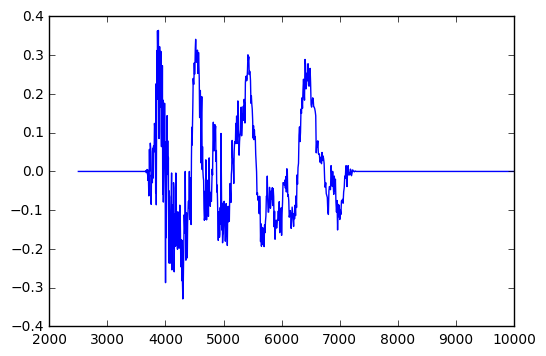

In [17]:
plt.plot(IcBL_wvl,IcBL_pre_smooth[14],color='b')
#plt.plot(IcBL_wvl,IcBL_smoothed_matrix[14],color='r')
#plt.plot(IcBL_wvl,IcBL_pre_smooth_IDL[14],color='g')

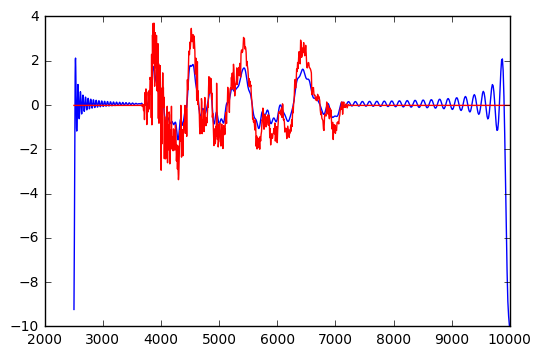

In [18]:
plt.plot(IcBL_wvl, (IcBL_smoothed_matrix[14]-np.mean(IcBL_smoothed_matrix))/np.std(IcBL_smoothed_matrix), color='b')
plt.plot(IcBL_wvl, (IcBL_pre_smooth[14]-np.mean(IcBL_pre_smooth[14]))/np.std(IcBL_pre_smooth[14]), color='r')

In [19]:
smooth_mean = np.nanmean(IcBL_smoothed_matrix, axis=1)

smooth_std = np.nanstd(IcBL_smoothed_matrix, axis=1)
original_smooth_spectra = np.copy(IcBL_smoothed_matrix)
IcBL_smoothed_matrixT = (IcBL_smoothed_matrix.T - smooth_mean)/smooth_std
IcBL_smoothed_matrix = IcBL_smoothed_matrixT.T

pre_smooth_mean = np.nanmean(IcBL_pre_smooth, axis=1)
pre_smooth_std = np.nanstd(IcBL_pre_smooth, axis=1)
original_pre_smooth_spectra = np.copy(IcBL_pre_smooth)
IcBL_pre_smooth_matrixT = (IcBL_pre_smooth.T - pre_smooth_mean)/pre_smooth_std
IcBL_pre_smooth = IcBL_pre_smooth_matrixT.T

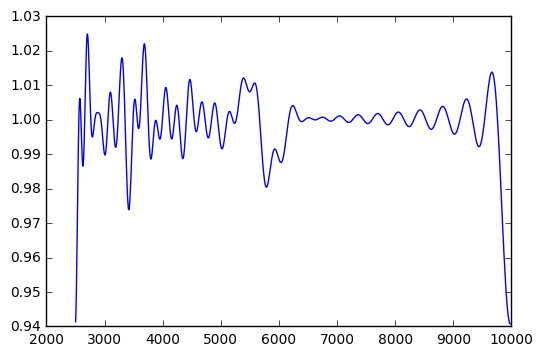

In [20]:
plt.plot(IcBL_wvl,original_smooth_spectra[1])

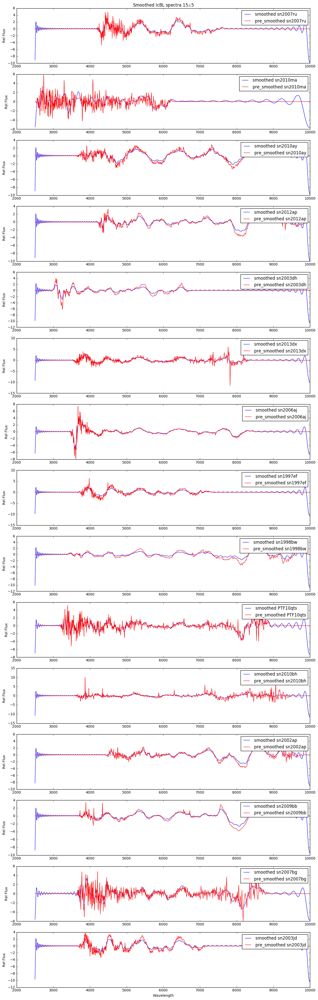

In [21]:
f = plt.figure(figsize=(15,50))
nshow=IcBL_smoothed_matrix.shape[0]
for i in range(nshow):
    plt.subplot(nshow,1,i+1)
    name = Ib_Ic_names[IcBLmask][i]
    plt.plot(IcBL_wvl, IcBL_smoothed_matrix[i], label="smoothed "+name,color='b')
    #plt.plot(IcBL_wvl, -IcBL_smoothed_matrix[i], label="smoothed "+name,color='g')
    plt.plot(IcBL_wvl, IcBL_pre_smooth[i], label="pre_smoothed "+name,color='r')
    if i==0:
        plt.title('Smoothed IcBL spectra 15$\pm$5')
    if i==nshow-1:
        plt.xlabel('Wavelength')
    plt.ylabel('Rel Flux')
    plt.legend(fontsize=12)
    
#f.savefig("plots/IcBL_smoothed_v2_spectra_phase15pm5.png")

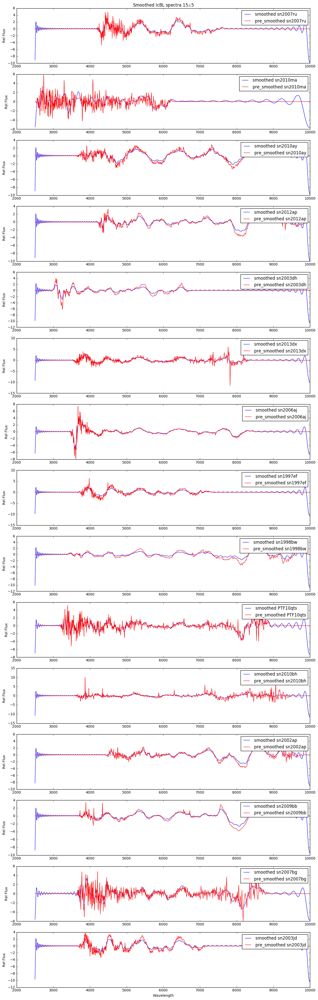

In [378]:
f.savefig()

In [20]:
IcBL_smoothed_matrix[14][500]

-0.80837435

In [21]:
IcBL_pre_smooth[14][500]

-1.1592722414785301

In [22]:
IcBL_smoothed_matrix[14][600]/IcBL_pre_smooth[14][600]

0.38306451084392201

In [23]:
Ib_Ic_names[IcBLmask]

array(['sn2007ru', 'sn2010ma', 'sn2010ay', 'sn2012ap', 'sn2003dh',
       'sn2013dx', 'sn2006aj', 'sn1997ef', 'sn1998bw', 'PTF10qts',
       'sn2010bh', 'sn2002ap', 'sn2009bb', 'sn2007bg', 'sn2003jd'], 
      dtype='|S12')

In [24]:
range(len(IcBLmask[IcBLmask==True]))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14]

In [25]:
phase_cols = np.array(phase_cols)
phase_cols[IcBLmask]

array([ 6,  2,  0,  9,  7, 12, 24, 12, 14,  3, 19, 16,  4,  2,  5])

In [26]:
skiprows.shape

(59,)

In [27]:
IcBLmask.shape

(59,)

(array([  4.,   5.,   8.,   4.,   8.,   8.,  10.,   7.,   1.,   4.]),
 array([ 10.4 ,  11.24,  12.08,  12.92,  13.76,  14.6 ,  15.44,  16.28,
         17.12,  17.96,  18.8 ]),
 <a list of 10 Patch objects>)

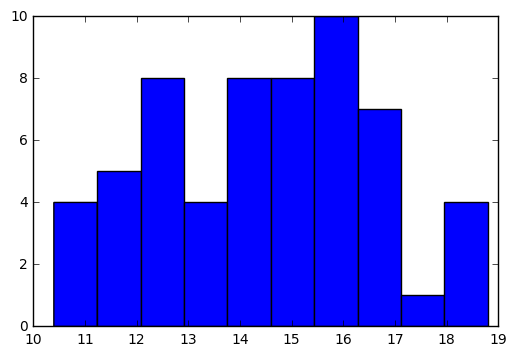

In [556]:
plt.hist(phase_arr)

In [557]:
# replace 0 values with NaN's

for i in range(spectra_matrix.shape[0]):
    spectra_matrix[i][spectra_matrix[i]==0] = np.nan
    

In [558]:
spectra_mean = np.nanmean(spectra_matrix, axis=1)
spectra_std = np.nanstd(spectra_matrix, axis=1)
original_spectra = np.copy(spectra_matrix)
spectra_matrixT = (spectra_matrix.T - spectra_mean)/spectra_std
spectra_matrix = spectra_matrixT.T

In [559]:
Ib_Ic_names[IcBLmask]

array(['sn2007ru', 'sn2010ma', 'sn2010ay', 'sn2012ap', 'sn2003dh',
       'sn2013dx', 'sn2006aj', 'sn1997ef', 'sn1998bw', 'PTF10qts',
       'sn2010bh', 'sn2002ap', 'sn2009bb', 'sn2007bg', 'sn2003jd'], 
      dtype='|S12')

In [560]:
spectra_matrix.shape

(59, 414)

In [457]:
np.where(Ib_Ic_names=='sn1997ef')[0][0]

25

In [458]:
for i,sn in enumerate(Ib_Ic_names[IcBLmask]):
    print sn
    smooth_spec = IcBL_smoothed_matrix[i]
    
    min_wavelength = 4000
    max_wavelength = 7000
    mask = np.logical_and(IcBL_wvl>min_wavelength, IcBL_wvl<max_wavelength)
    smooth_spec = smooth_spec[mask]
    #print smooth_spec
    ind = np.where(Ib_Ic_names==sn)[0][0]
    spectra_matrix[ind] = smooth_spec

sn2007ru


NameError: name 'IcBL_smoothed_matrix' is not defined

(414,)
(1, 414)


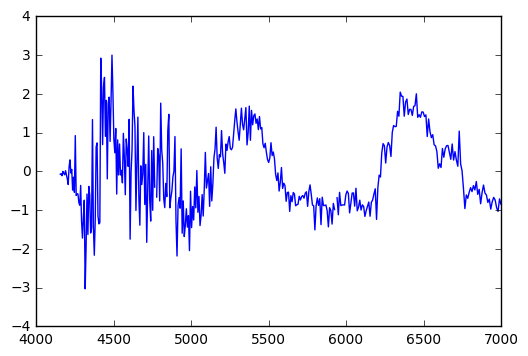

In [459]:
print wavelengths.shape
print spectra_matrix[Ib_Ic_names=='sn2007ru'].shape
plt.plot(wavelengths, spectra_matrix[Ib_Ic_names=='sn2007ru'][0])


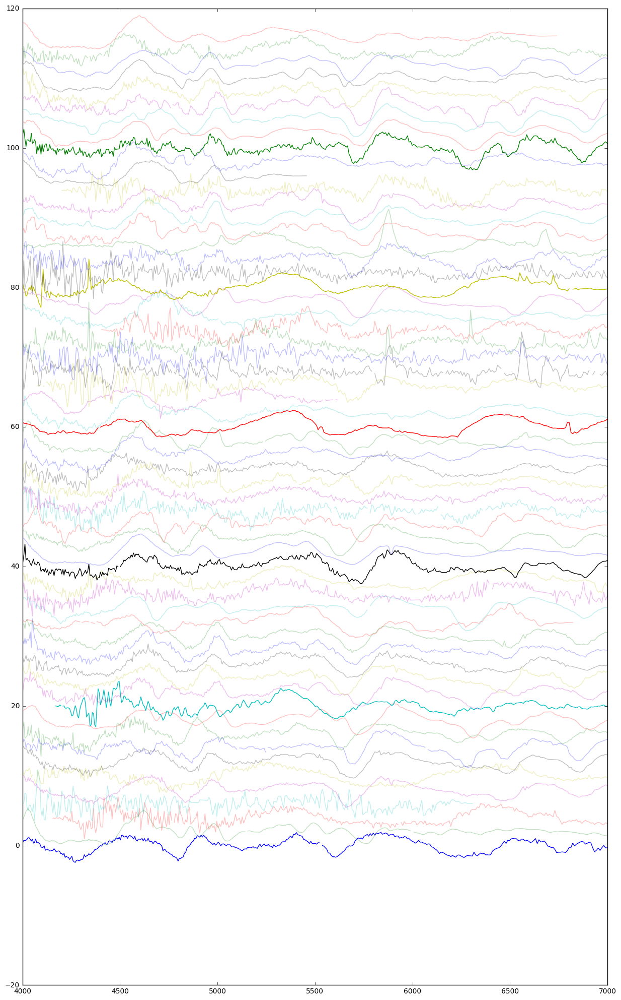

In [561]:
plt.figure(figsize=(15,25))
for i,spec in enumerate(spectra_matrix):
    alpha=0.25
    if not i%10:
        alpha=1
    plt.plot(wavelengths,spec+i*2, alpha=alpha)

# Data Cleaning

## Test spectrum interpolation

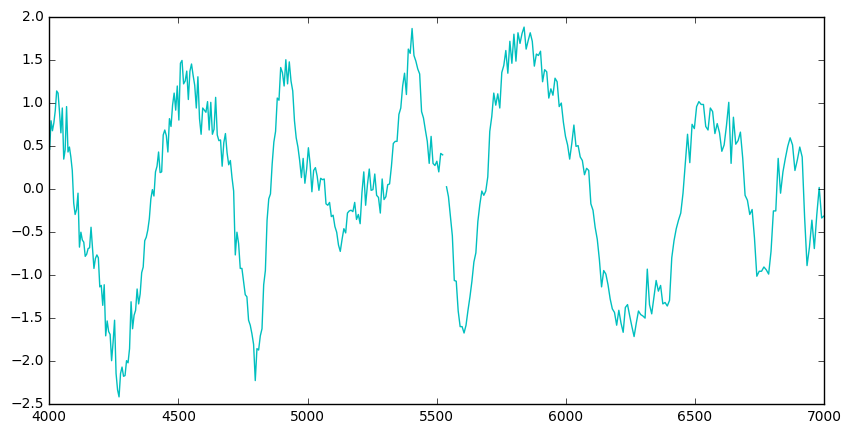

In [562]:
test_spec = spectra_matrix[0]
plt.figure(figsize=(10,5))
plt.plot(wavelengths,test_spec,'c')

In [563]:
from scipy.interpolate import interp1d

In [564]:
good_values = np.isfinite(test_spec)
interp_fn = interp1d(wavelengths[good_values],test_spec[good_values])

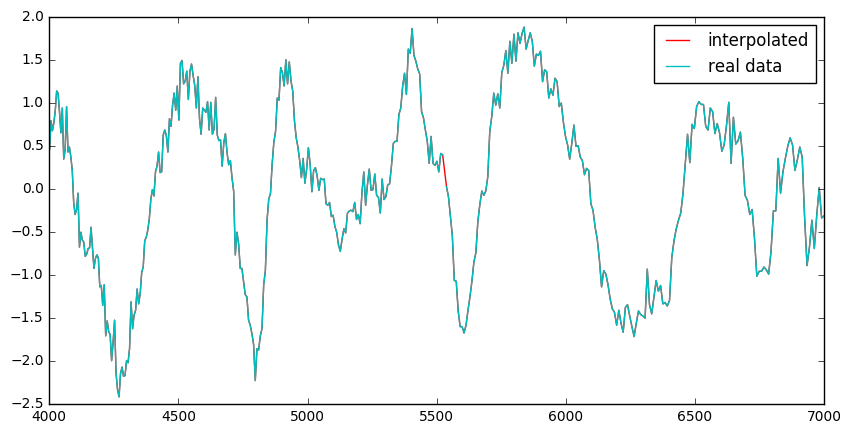

In [565]:
plt.figure(figsize=(10,5))
p1 = plt.plot(wavelengths,interp_fn(wavelengths),'r',label="interpolated")
p2 = plt.plot(wavelengths,test_spec,'c',label="real data")
plt.legend()

## Re-bin (lower resolution b/c don't care about noise)

In [566]:
print spectra_matrix.shape
print wavelengths.shape

(59, 414)
(414,)


In [567]:
nrows, ncols = spectra_matrix.shape
smoothing = 2 # Width of bins in terms of number of wavelength steps
tmp = np.reshape(spectra_matrix,(nrows, ncols/smoothing, smoothing))

In [568]:
spectra_matrix = np.nanmean(tmp, axis=2)

In [569]:
spectra_matrix.shape

(59, 207)

In [570]:
wvrows = wavelengths.shape[0]
wvcols = 1
wvtemp = np.reshape(wavelengths, (wvrows/smoothing,1,smoothing))
print wvtemp.shape
wavelengths = np.nanmean(wvtemp, axis=2)

(207, 1, 2)


In [571]:
wavelengths.shape

(207, 1)

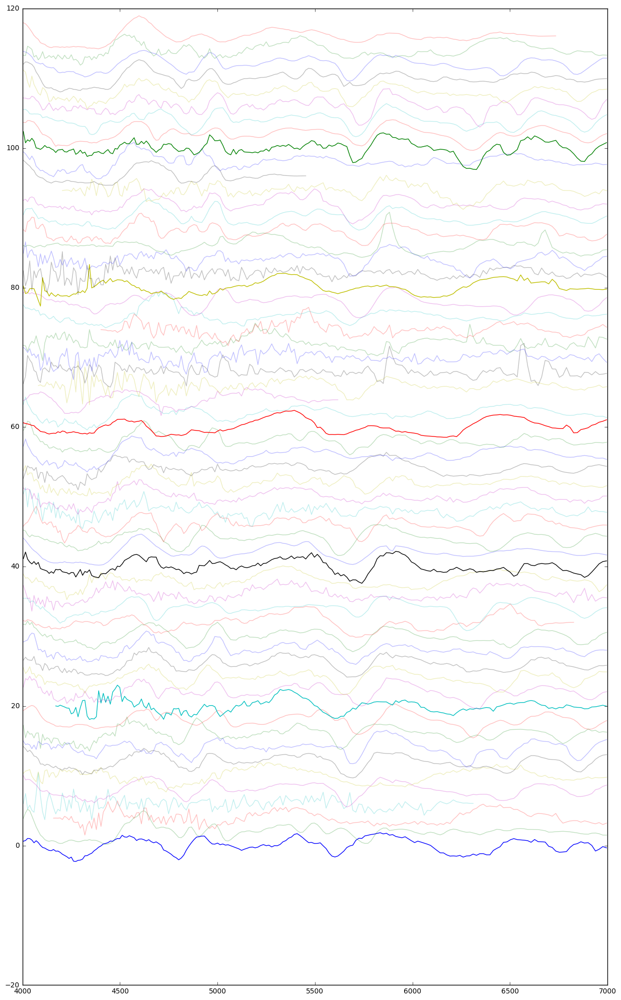

In [572]:
# Plot the spectra post data processing

plt.figure(figsize=(15,25))
for i,spec in enumerate(spectra_matrix):
    alpha=0.25
    if not i%10:
        alpha=1
    plt.plot(wavelengths,spec+i*2, alpha=alpha)

In [573]:
big_gap_mask = np.array([np.isnan(spec).any() for spec in spectra_matrix])
print 'total number of bad spectra = %d'%(np.sum(big_gap_mask))

total number of bad spectra = 10


In [574]:
spectra_matrix = spectra_matrix[np.invert(big_gap_mask)]
SN_type_vec = SN_type_vec[np.invert(big_gap_mask)]
Ib_Ic_names = Ib_Ic_names[np.invert(big_gap_mask)]


In [575]:
phase_arr = phase_arr[np.invert(big_gap_mask)]

In [576]:
phase_arr.shape

(49,)

In [577]:
print spectra_matrix.shape
print SN_type_vec.shape
print Ib_Ic_names.shape

(49, 207)
(49, 2)
(49,)


In [578]:
#plt.figure(figsize=(15,25))
data = []
for i,spec in enumerate(spectra_matrix):
    alpha=0.25
    if not i%10:
        alpha=1
    trace = go.Scatter(x=wavelengths, y=spec+i*2, mode='lines', text=len(wavelengths)*[Ib_Ic_names[i]])
    data.append(trace)
layout = go.Layout(showlegend=False, autosize=False, width=1000, height=2000, title='SNID Spectra',
                  xaxis=dict(title='Wavelength'))
fig = go.Figure(data=data, layout=layout)
ply.iplot(fig)
    #plt.plot(wavelengths,spec+i*2, alpha=alpha)
    
#plt.title('SNID Spectra')
#plt.xlabel('Wavelength')
#plt.savefig('plots/All_spec_post_process_phase15pm5.png')

/home/data/mew488/virtualenvs/mypy2.7/lib/python2.7/site-packages/requests/packages/urllib3/util/ssl_.py:122: InsecurePlatformWarning:

A true SSLContext object is not available. This prevents urllib3 from configuring SSL appropriately and may cause certain SSL connections to fail. You can upgrade to a newer version of Python to solve this. For more information, see https://urllib3.readthedocs.io/en/latest/security.html#insecureplatformwarning.



PlotlyRequestError: Account limit reached: Your account is limited to creating 25 charts. To continue, you can override or delete existing charts or you can upgrade your account at: https://plot.ly/products/cloud

## PCA Decomposition

In [579]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import Imputer


#imp = Imputer(missing_values='NaN', strategy='mean', axis=1, verbose=0, copy=True)


In [580]:
#spectra_matrix = imp.fit_transform(spectra_matrix)

In [581]:
spectra_matrix.shape

(49, 207)

In [582]:
spectra_matrix

array([[ 0.62930825,  0.72409766,  1.02495099, ..., -0.52464973,
        -0.14137083, -0.32270709],
       [ 1.90843201,  2.70317511,  3.20039899, ..., -0.30054624,
        -0.4941375 , -0.50025091],
       [ 2.0173673 ,  1.42111862,  1.49625565, ...,  0.14863669,
         0.4879652 ,  0.66247701],
       ..., 
       [ 2.04228466,  2.34698526,  2.31969864, ..., -0.09971509,
        -0.07242847, -0.03604631],
       [ 1.84725525,  1.7697524 ,  1.63024726, ...,  0.60720959,
         0.89286297,  0.87957677],
       [-0.68702565, -0.74993009,  0.60601004, ..., -0.73944602,
        -0.65557343, -0.68702565]])

In [583]:
pca = PCA()

In [584]:
pca.fit(spectra_matrix)

PCA(copy=True, iterated_power='auto', n_components=None, random_state=None,
  svd_solver='auto', tol=0.0, whiten=False)

In [585]:
pca.components_

array([[-0.06585487, -0.09261619, -0.08220464, ..., -0.01753717,
        -0.03406281, -0.04689867],
       [-0.07486536, -0.09026583, -0.067392  , ...,  0.02110574,
         0.03851631,  0.05017289],
       [-0.01020957, -0.07726505, -0.05753052, ...,  0.08447767,
         0.07229636,  0.05126563],
       ..., 
       [-0.00907956, -0.08752742, -0.11057251, ...,  0.02760203,
         0.0650043 ,  0.11418852],
       [ 0.07524837, -0.13848571,  0.0919643 , ..., -0.0460916 ,
         0.00827705, -0.0320545 ],
       [ 0.1119772 , -0.04948357, -0.16699021, ...,  0.00128165,
         0.00608689,  0.00186927]])

In [586]:
evecs = pca.components_
evals = pca.explained_variance_ratio_
evals_cs = evals.cumsum()

n_evecs = evecs.shape[0]
n_feat = evecs.shape[1]

In [587]:
print evecs.shape
print evals.shape

(49, 207)
(49,)


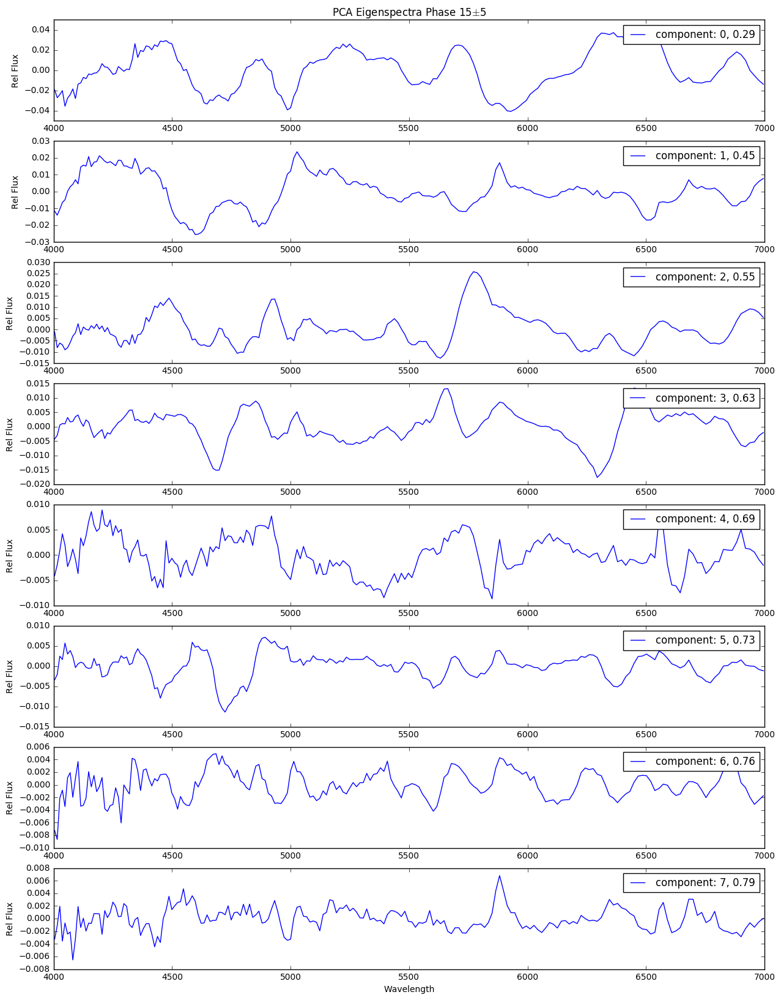

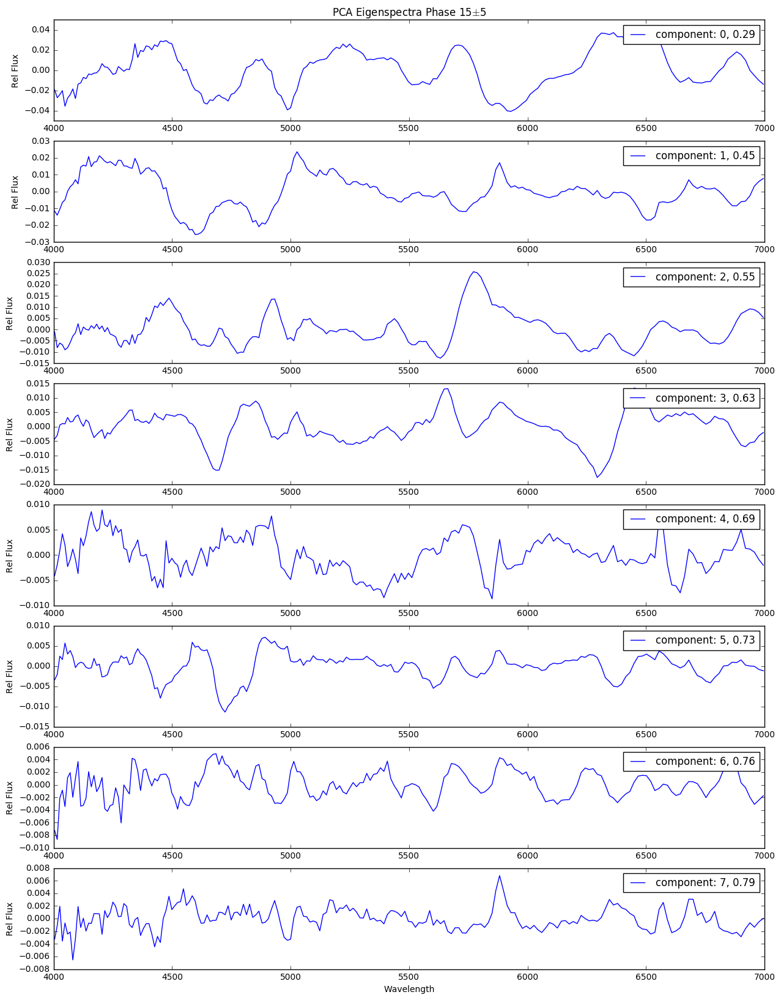

In [588]:
f = plt.figure(figsize=(15,20))
nshow=8
for i,ev in enumerate(evecs[:nshow]):
    #plt.figure(figsize=(15,2))
    plt.subplot(nshow,1,i+1)
    plt.plot(wavelengths,evals[i]*(ev), label="component: %d, %.2f"%(i,evals_cs[i]))
    if i==0:
        plt.title('PCA Eigenspectra Phase 15$\pm$5')
    if i==nshow-1:
        plt.xlabel('Wavelength')
    plt.ylabel('Rel Flux')
    plt.legend(fontsize=12)
    
f  
#plt.savefig("plots/smooth_PCA_eigenspectra_phase15pm5.png")
#plssaddddg("plots/PCA_eigenspectra_phase155.png")
#np.save('eigen_spec_phase15pm5.npy',evecs[:8])
#np.save('wavelengths_phase15pm5.npy',wavelengths)

## Recreate Spectra from PCA

[46]
[0, 4, 8, 20, 49]
(49, 207)
(207,)


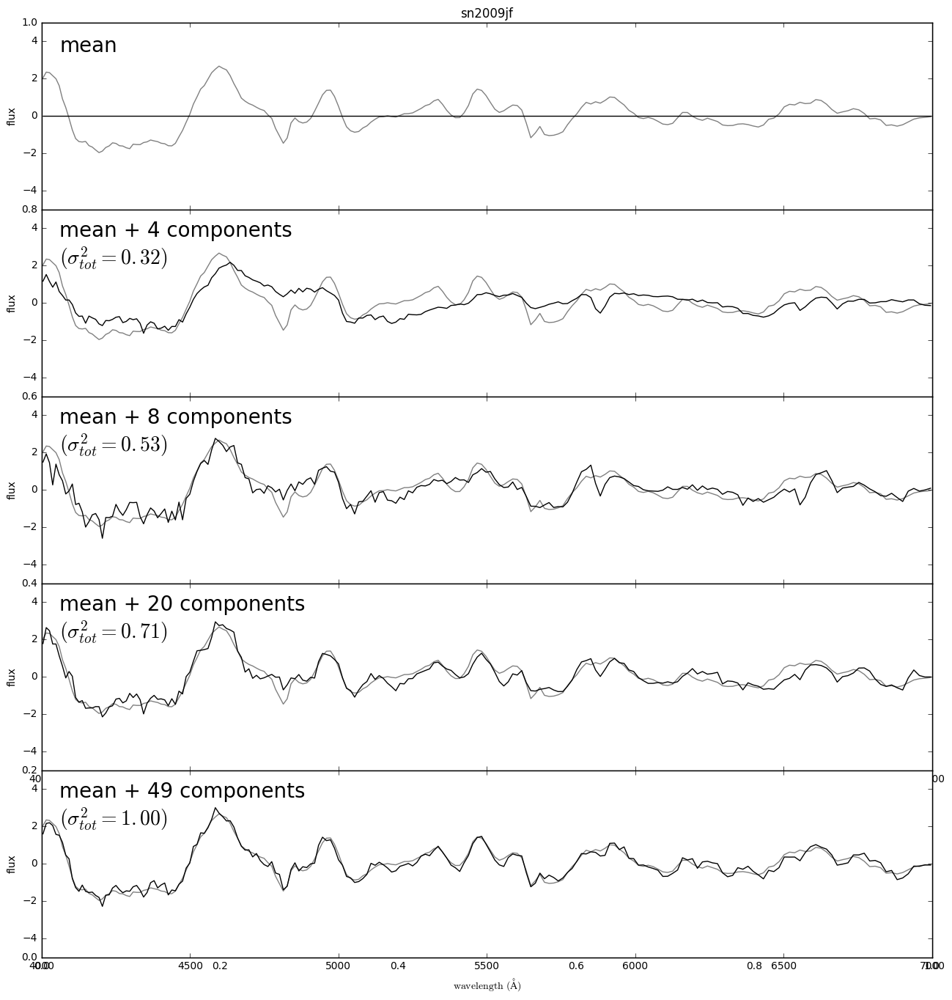

In [589]:
# Recreate 10 random spectra using the PCA decomposition
random_spec = np.random.randint(0,spectra_matrix.shape[0],1)
print random_spec
n_pca_components = [0,4,8,20,n_evecs]
print n_pca_components

for j,spec in enumerate(random_spec):
    spec_name = Ib_Ic_names[spec]
    true_spec = spectra_matrix[spec]
    
    print evecs.shape
    print spectra_matrix[spec].shape
    pca_coeff = np.dot(evecs, spectra_matrix[spec])
    
    
    #------------------------------------------------------------
    # Plot the sequence of reconstructions
    fig = plt.figure(j, figsize=(15, 15))
    plt.title(spec_name)
    fig.subplots_adjust(hspace=0, top=0.95, bottom=0.1, left=0.12, right=0.93)

    for i, n in enumerate(n_pca_components):#, len(pca.components_)]):
        ax = fig.add_subplot(511 + i)
        ax.plot(wavelengths, true_spec, '-', c='gray')
        ax.plot(wavelengths, (np.dot(pca_coeff[:n], evecs[:n])), '-k')
        
        if i < 3:
            ax.xaxis.set_major_formatter(plt.NullFormatter())
            
        ax.set_ylim(-5, 5)
        ax.set_ylabel('flux')

        if n == 0:
            text = "mean"
        elif n == 1:
            text = "mean + 1 component\n"
            #text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
            text += r"$(\sigma^2_{tot} = %.2f)$" % percent_reconstruct(pca_coeff,n)
        else:
            text = "mean + %i components\n" % n
            #text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
            text += r"$(\sigma^2_{tot} = %.2f)$" % percent_reconstruct(pca_coeff,n)
            
        ax.text(0.02, 0.93, text, fontsize=20,ha='left', va='top', transform=ax.transAxes)

        fig.axes[-1].set_xlabel(r'${\rm wavelength\ (\AA)}$')
#fig.savefig('plots/PCA_spec_recreate_phase15pm5.png')

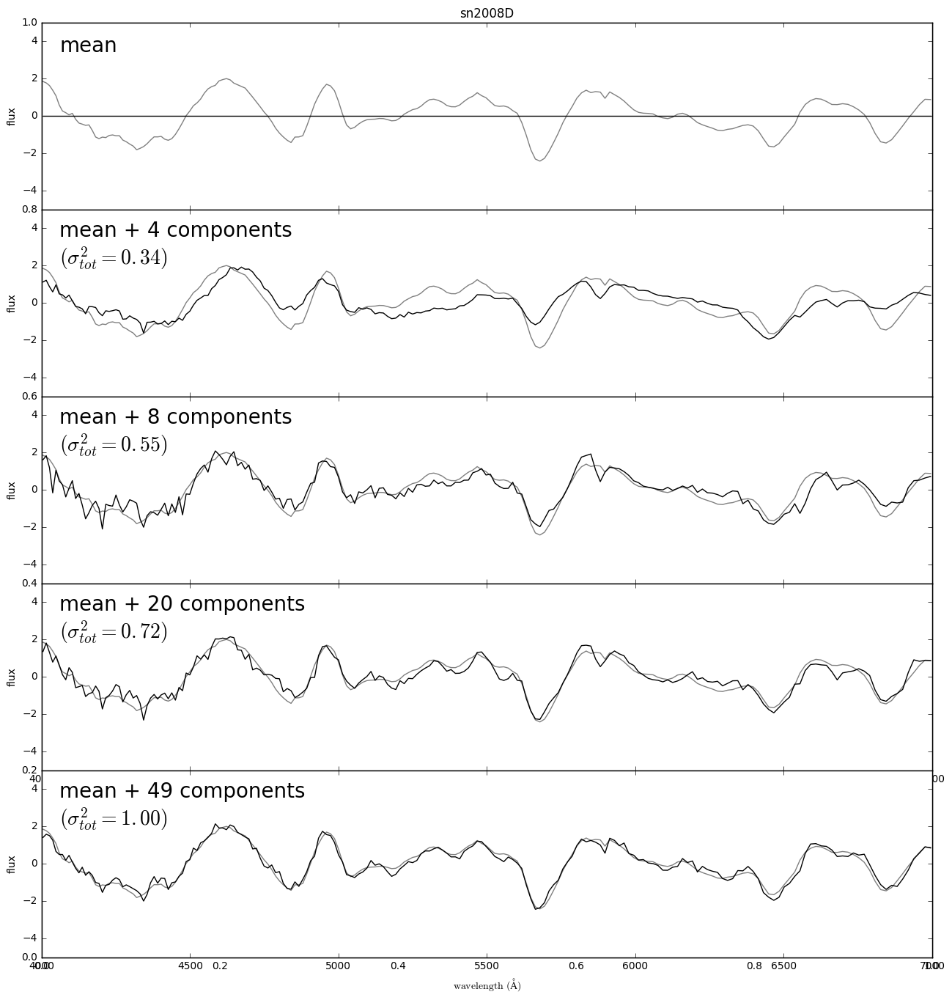

In [146]:
fig

In [200]:
plotly_fig = tls.mpl_to_plotly(fig)
ply.iplot(plotly_fig)

/home/data/mew488/virtualenvs/mypy2.7/lib/python2.7/site-packages/plotly/tools.py:1341: UserWarning:

Looks like you used a newline character: '\n'.

Plotly uses a subset of HTML escape characters
to do things like newline (<br>), bold (<b></b>),
italics (<i></i>), etc. Your newline characters 
have been converted to '<br>' so they will show 
up right on your Plotly figure!

/home/data/mew488/virtualenvs/mypy2.7/lib/python2.7/site-packages/requests/packages/urllib3/util/ssl_.py:122: InsecurePlatformWarning:

A true SSLContext object is not available. This prevents urllib3 from configuring SSL appropriately and may cause certain SSL connections to fail. You can upgrade to a newer version of Python to solve this. For more information, see https://urllib3.readthedocs.io/en/latest/security.html#insecureplatformwarning.



PlotlyRequestError: Account limit reached: Your account is limited to creating 25 charts. To continue, you can override or delete existing charts or you can upgrade your account at: https://plot.ly/products/cloud

# 2D PCA Component Marginalizations

In [590]:
print spectra_matrix.shape
print evecs.shape

(49, 207)
(49, 207)


In [591]:
spectra_pca_matrix = np.dot(evecs, spectra_matrix.T).T

In [592]:
spectra_pca_matrix = []
for i, spec in enumerate(spectra_matrix):
    pca_cf = np.dot(evecs, spec)
    spectra_pca_matrix.append(pca_cf)
spectra_pca_matrix = np.array(spectra_pca_matrix)
print spectra_pca_matrix.shape

(49, 49)


In [593]:
colors = []
for tup in SN_type_vec:
    if tup[0]==2:
        if tup[1]==4:
            colors.append('g')
        else:
            colors.append('c')
    else:
        if tup[1]==4:
            colors.append('k')
        else:
            colors.append('r')
colors = np.array(colors)            
print colors
print len(colors)
Ib_mask = colors=='c'
IIb_mask = colors=='g'
Ic_mask = colors=='r'
Ic_broad_mask = colors=='k'

['c' 'r' 'c' 'k' 'c' 'g' 'c' 'g' 'g' 'c' 'c' 'c' 'c' 'g' 'k' 'k' 'c' 'r'
 'c' 'g' 'r' 'k' 'r' 'c' 'r' 'c' 'k' 'r' 'c' 'k' 'k' 'c' 'c' 'k' 'k' 'g'
 'c' 'g' 'c' 'r' 'r' 'g' 'g' 'g' 'g' 'c' 'c' 'c' 'k']
49


In [594]:
Ib_mask

array([ True, False,  True, False,  True, False,  True, False, False,
        True,  True,  True,  True, False, False, False,  True, False,
        True, False, False, False, False,  True, False,  True, False,
       False,  True, False, False,  True,  True, False, False, False,
        True, False,  True, False, False, False, False, False, False,
        True,  True,  True, False], dtype=bool)

In [595]:
print SN_type_vec.shape
print len(colors)
color_mask = np.invert(np.array(colors)=='g')
color_mask = np.array([True for c in colors])
print color_mask

(49, 2)
49
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True]


(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)


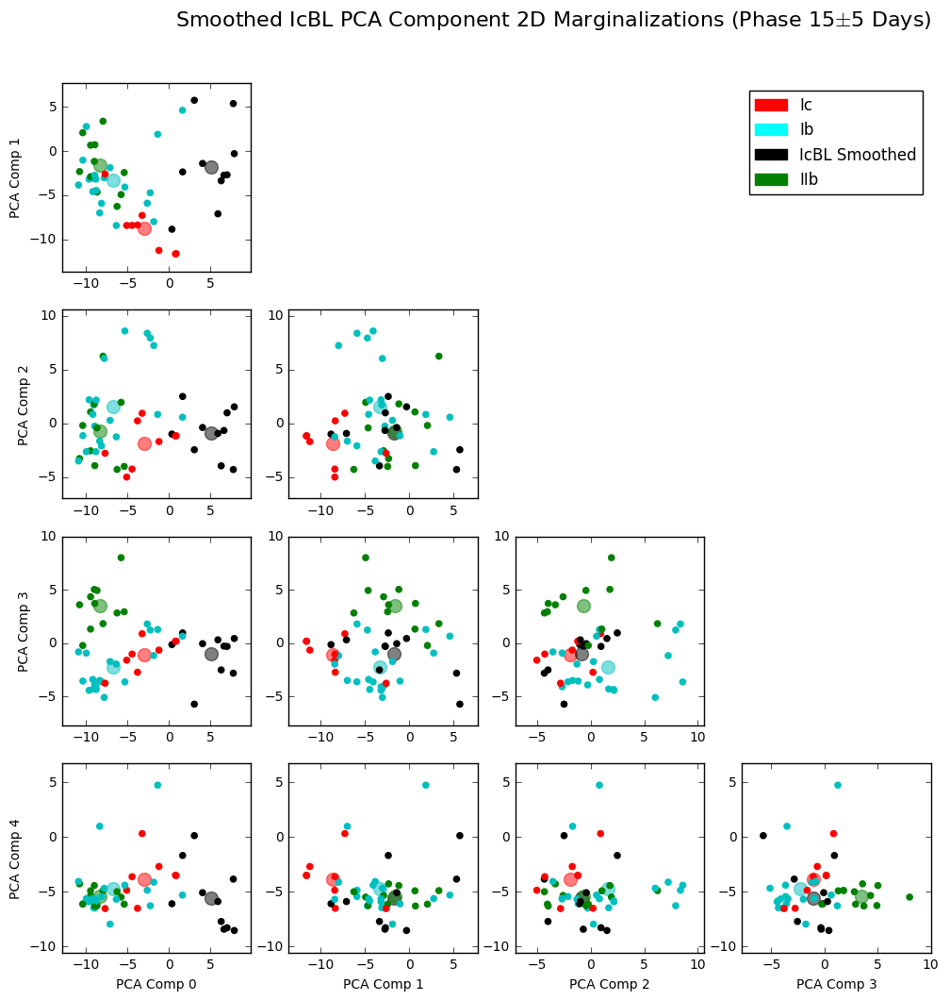

In [596]:
import matplotlib.patches as mpatches


red_patch = mpatches.Patch(color='red', label='Ic')
cyan_patch = mpatches.Patch(color='cyan', label='Ib')
black_patch = mpatches.Patch(color='black', label='IcBL Smoothed')
green_patch = mpatches.Patch(color='green', label='IIb')

colors_types = ['c', 'r', 'k', 'g']

ncomp = 5
fig=plt.figure(figsize=(15, 15))
for i in range(ncomp):
    for j in range(ncomp):
        if i > j:
            plot_number = ncomp*i+j+1
            plt.subplot(ncomp,ncomp,plot_number)
            x = spectra_pca_matrix[:,i][color_mask]
            y = spectra_pca_matrix[:,j][color_mask]
            
            for col in colors_types:
                tmp_mask = colors==col
                xmean = np.mean(x[tmp_mask])
                ymean = np.mean(y[tmp_mask])
                plt.scatter(ymean, xmean, color=col, alpha=.5, s=100)
            
            print "(x,y) shape is (%d,%d)"%(len(x),len(y))
            plt.scatter(y,x,color=colors[color_mask],alpha=1)
            plt.xlim((np.min(spectra_pca_matrix[:,j])-2,np.max(spectra_pca_matrix[:,j])+2))
            plt.ylim((np.min(spectra_pca_matrix[:,i])-2,np.max(spectra_pca_matrix[:,i])+2))
            #plt.xlim((-5,5))
            #plt.ylim((-5,5))
            if j==0:
                plt.ylabel('PCA Comp %d'%(i))
            if i==ncomp-1:
                plt.xlabel('PCA Comp %d'%(j))

                
                
plt.subplot(5,5,9)
plt.axis('off')
plt.legend(handles=[red_patch, cyan_patch, black_patch, green_patch])
#plt.text(-3.0,1.3,'PCA Component 2D Marginalizations (Phase 0$\pm$5 Days)',fontsize=16)
plt.text(-3.0,1.3,'Smoothed IcBL PCA Component 2D Marginalizations (Phase 15$\pm$5 Days)',fontsize=16)


plt.savefig('plots/Smooth_PCA_2Dcomp_phase15pm5.png')

In [597]:
import matplotlib.patches as mpatches
from plotly import tools


col_red = 'rgba(152, 0, 0, 1)'
col_blue = 'rgba(0, 152, 152, 1)'
col_green = 'rgba(0, 152, 0, 1)'
col_black = 'rgba(0, 0, 0, 152)'

red_patch = mpatches.Patch(color='red', label='Ic')
cyan_patch = mpatches.Patch(color='cyan', label='Ib')
black_patch = mpatches.Patch(color='black', label='Ic broad')
green_patch = mpatches.Patch(color='green', label='IIb')

colors_types = ['c', 'r', 'k', 'g']

ncomp = 5
spec = plotly_corner_spec(ncomp)
print spec
fig = tools.make_subplots(rows=ncomp-1, cols=ncomp-1, specs=spec)
for i in range(ncomp):
    for j in range(ncomp):
        if i > j:
            
            
            

            trace0= go.Scatter(
                y= spectra_pca_matrix[:,i][Ib_mask],
                x= spectra_pca_matrix[:,j][Ib_mask],
                mode= 'markers',
                marker= dict(size= 6,
                    line= dict(width=1),
                    color= col_blue,
                    opacity= 1
                   ),
                text= Ib_Ic_names[Ib_mask])
            
            
            trace1= go.Scatter(
                y= spectra_pca_matrix[:,i][IIb_mask],
                x= spectra_pca_matrix[:,j][IIb_mask],
                mode= 'markers',
                marker= dict(size= 6,
                    line= dict(width=1),
                    color= col_green,
                    opacity= 1
                   ),
                text= Ib_Ic_names[IIb_mask])
            
            trace2= go.Scatter(
                y= spectra_pca_matrix[:,i][Ic_mask],
                x= spectra_pca_matrix[:,j][Ic_mask],
                mode= 'markers',
                marker= dict(size= 6,
                    line= dict(width=1),
                    color= col_red,
                    opacity= 1
                   ),
                text= Ib_Ic_names[Ic_mask])
            
            trace3= go.Scatter(
                y= spectra_pca_matrix[:,i][Ic_broad_mask],
                x= spectra_pca_matrix[:,j][Ic_broad_mask],
                mode= 'markers',
                marker= dict(size= 6,
                    line= dict(width=1),
                    color= col_black,
                    opacity= 1
                   ),
                text= Ib_Ic_names[Ic_broad_mask])
            
            fig.append_trace(trace0,i,j+1)
            fig.append_trace(trace1,i,j+1)
            fig.append_trace(trace2,i,j+1)
            fig.append_trace(trace3,i,j+1)
            
            
            #for col in colors_types:
            #    tmp_mask = colors==col
            #    xmean = np.mean(x[tmp_mask])
            #    ymean = np.mean(y[tmp_mask])
            #    plt.scatter(ymean, xmean, color=col, alpha=.5, s=100)
            
                
#layout = go.Layout(showlegend=False, autosize=False, width=1000, height=2000, 
#                   title='PCA Component 2D Marginalizations (Phase 0$\pm$5 Days)')
                  
fig['layout'].update(showlegend=False, autosize=False, 
                     height=1000, width=1000, title='PCA Component 2D Marginalizations Phase 15 +/- 5',
                    
                     yaxis1=dict(title='PCA 1'),yaxis2=dict(title='PCA 2'), yaxis4=dict(title='PCA 3'),   
                     xaxis7=dict(title='PCA 0'), yaxis7=dict(title='PCA 4'), xaxis8=dict(title='PCA 1'), 
                     xaxis9=dict(title='PCA 2'), xaxis10=dict(title='PCA 3')
                     
                    )

#xaxis1=dict(title='PCA 0'), yaxis1=dict(title='PCA 1'), xaxis2=dict(title='PCA 0'), 
#yaxis2=dict(title='PCA 2'), xaxis3=dict(title='PCA 1'), yaxis3=dict(title='PCA 2'),
#xaxis4=dict(title='PCA 0'), yaxis4=dict(title='PCA 3'), xaxis5=dict(title='PCA 1'), 
#yaxis5=dict(title='PCA 3'), xaxis6=dict(title='PCA 2'), yaxis6=dict(title='PCA 3'),
#xaxis7=dict(title='PCA 0'), yaxis7=dict(title='PCA 4'), xaxis8=dict(title='PCA 1'), 
#yaxis8=dict(title='PCA 4'), xaxis9=dict(title='PCA 2'), yaxis9=dict(title='PCA 4'),
#xaxis10=dict(title='PCA 3'), yaxis10=dict(title='PCA 4')
ply.iplot(fig)
#plt.savefig('plots/PCA_2Dcomp_phase0pm5.png')

[[{}, None, None, None], [{}, {}, None, None], [{}, {}, {}, None], [{}, {}, {}, {}]]
This is the format of your plot grid:
[ (1,1) x1,y1 ]        (empty)            (empty)            (empty)      
[ (2,1) x2,y2 ]    [ (2,2) x3,y3 ]        (empty)            (empty)      
[ (3,1) x4,y4 ]    [ (3,2) x5,y5 ]    [ (3,3) x6,y6 ]        (empty)      
[ (4,1) x7,y7 ]    [ (4,2) x8,y8 ]    [ (4,3) x9,y9 ]    [ (4,4) x10,y10 ]



/home/data/mew488/virtualenvs/mypy2.7/lib/python2.7/site-packages/requests/packages/urllib3/util/ssl_.py:122: InsecurePlatformWarning:

A true SSLContext object is not available. This prevents urllib3 from configuring SSL appropriately and may cause certain SSL connections to fail. You can upgrade to a newer version of Python to solve this. For more information, see https://urllib3.readthedocs.io/en/latest/security.html#insecureplatformwarning.



PlotlyRequestError: Account limit reached: Your account is limited to creating 25 charts. To continue, you can override or delete existing charts or you can upgrade your account at: https://plot.ly/products/cloud

In [ ]:
fig.layout

(<mpl_toolkits.axes_grid1.inset_locator.BboxPatch at 0x7f223001f890>,
 <mpl_toolkits.axes_grid1.inset_locator.BboxConnector at 0x234a0210>)

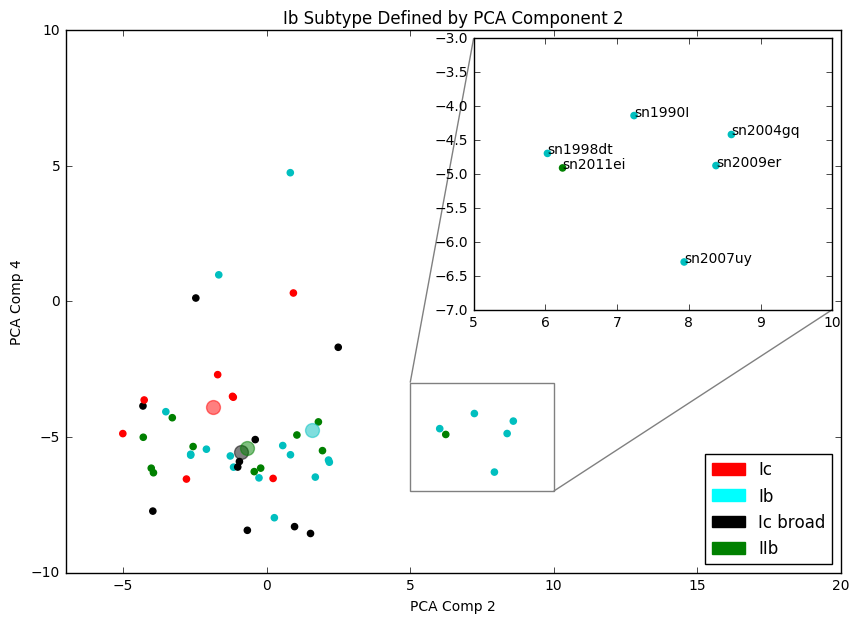

In [598]:
fig, ax = plt.subplots(figsize=(10,7))

pca_x = 2
pca_y = 4


x = spectra_pca_matrix[:,pca_x]
y = spectra_pca_matrix[:,pca_y]
plt.scatter(x,y,color=colors)

#for i, txt in enumerate(Ib_Ic_names):
#    ax.annotate(txt,(spectra_pca_matrix[:,2][i],spectra_pca_matrix[:,4][i]))


for col in colors_types:
    tmp_mask = colors==col
    xmean = np.mean(x[tmp_mask])
    ymean = np.mean(y[tmp_mask])
    plt.scatter(xmean, ymean, color=col, alpha=.5, s=100)


plt.xlabel('PCA Comp %d'%(pca_x))
plt.ylabel('PCA Comp %d'%(pca_y))
plt.xlim((-7,20))
plt.ylim((-10,10))

red_patch = mpatches.Patch(color='red', label='Ic')
cyan_patch = mpatches.Patch(color='cyan', label='Ib')
black_patch = mpatches.Patch(color='black', label='Ic broad')
green_patch = mpatches.Patch(color='green', label='IIb')
plt.legend(handles=[red_patch, cyan_patch, black_patch, green_patch],loc='lower right')
plt.title('Ib Subtype Defined by PCA Component 2')


from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
axins = zoomed_inset_axes(ax, 2.5, loc=1) # zoom-factor: 2.5, location: upper-left

x1, x2, y1, y2 = 5, 10, -7, -3 # specify the limits (use for pca 2 vs pca 4)
#x1, x2, y1, y2 = -10, -6, -3, 0.5 # specify the limits (rogue in Ic)
#x1, x2, y1, y2 = -4, -2, -5, -2 # specify the limits (rogue in Ib)
#x1, x2, y1, y2 = 5, 10, -2, 2# specify the limits (rogue in Ib)



xzoom = np.logical_and(x>x1, x<x2)
yzoom = np.logical_and(y>y1,y<y2)
zoom_mask = np.logical_and(xzoom, yzoom)


for i, txt in enumerate(Ib_Ic_names[zoom_mask]):
    axins.annotate(txt,(x[zoom_mask][i],y[zoom_mask][i]))


axins.scatter(spectra_pca_matrix[:,pca_x][zoom_mask],spectra_pca_matrix[:,pca_y][zoom_mask],color=colors[zoom_mask])

for col in colors_types:
    tmp_mask = colors==col
    xmean = np.mean(x[tmp_mask])
    ymean = np.mean(y[tmp_mask])
    axins.scatter(xmean, ymean, color=col, alpha=.5, s=100)


axins.set_xlim(x1, x2) # apply the x-limits
axins.set_ylim(y1, y2) # apply the y-limits




#plt.yticks(visible=False)
#plt.xticks(visible=False)

from mpl_toolkits.axes_grid1.inset_locator import mark_inset
mark_inset(ax, axins, loc1=2, loc2=4, fc="none", ec="0.5")
#plt.savefig('plots/PCA_Comp2_subtype_zoomin_phase15pm5.png')
#fig

(<mpl_toolkits.axes_grid1.inset_locator.BboxPatch at 0x23206f50>,
 <mpl_toolkits.axes_grid1.inset_locator.BboxConnector at 0x24a4a110>)

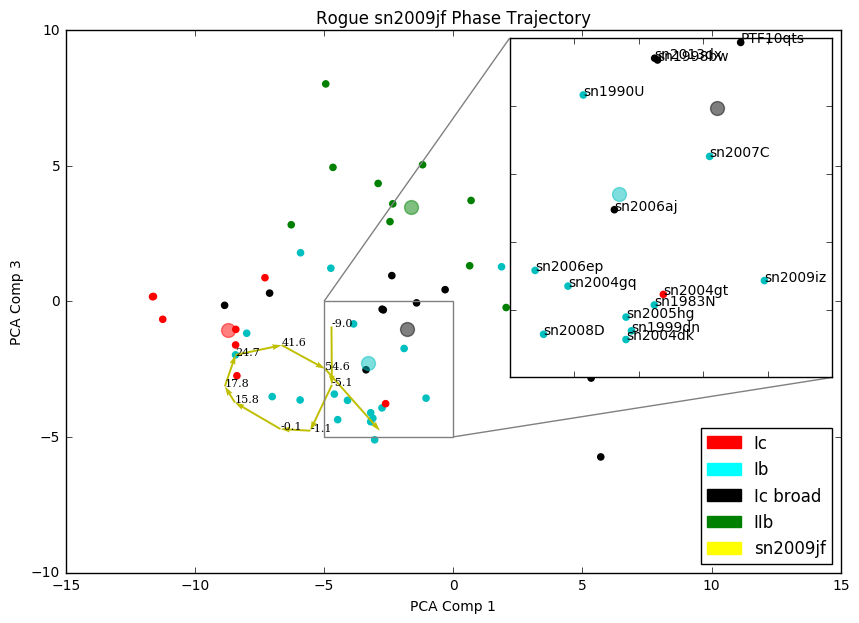

In [599]:
fig, ax = plt.subplots(figsize=(10,7))

pca_x = 1
pca_y = 3

#old_09jf_col = colors[np.where(Ib_Ic_names=='sn2009jf')[0][0]]
#colors[np.where(Ib_Ic_names=='sn2009jf')[0][0]] = 'y'
x = spectra_pca_matrix[:,pca_x]
y = spectra_pca_matrix[:,pca_y]
plt.scatter(x,y,color=colors)
#colors[np.where(Ib_Ic_names=='sn2009jf')[0][0]] = old_09jf_col

snid_phase_x = snid_phase_pca_mat[:,pca_x]
snid_phase_y = snid_phase_pca_mat[:,pca_y]
plt.quiver(snid_phase_x[:-1], snid_phase_y[:-1], snid_phase_x[1:]-snid_phase_x[:-1], 
           snid_phase_y[1:]-snid_phase_y[:-1], color=43*['y'],width=.005/2,scale_units='xy', angles='xy', scale=1)

font = {'family': 'serif',
        'color':  'k',
        'weight': 'normal',
        'size': 8,
        }
for i,ph in enumerate(snid_phases):
    plt.text(x=snid_phase_x[i], y=snid_phase_y[i],s=str(ph),fontdict=font)


#for i, txt in enumerate(Ib_Ic_names):
#    ax.annotate(txt,(spectra_pca_matrix[:,2][i],spectra_pca_matrix[:,4][i]))


for col in colors_types:
    tmp_mask = colors==col
    xmean = np.mean(x[tmp_mask])
    ymean = np.mean(y[tmp_mask])
    plt.scatter(xmean, ymean, color=col, alpha=.5, s=100)

plt.xlabel('PCA Comp %d'%(pca_x))
plt.ylabel('PCA Comp %d'%(pca_y))
plt.xlim((-15,15))
plt.ylim((-10,10))

red_patch = mpatches.Patch(color='red', label='Ic')
cyan_patch = mpatches.Patch(color='cyan', label='Ib')
black_patch = mpatches.Patch(color='black', label='Ic broad')
green_patch = mpatches.Patch(color='green', label='IIb')
yellow_patch = mpatches.Patch(color='yellow', label='sn2009jf')
plt.legend(handles=[red_patch, cyan_patch, black_patch, green_patch, yellow_patch],loc='lower right')
plt.title('Rogue sn2009jf Phase Trajectory')


from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
axins = zoomed_inset_axes(ax, 2.5, loc=1) # zoom-factor: 2.5, location: upper-left

#x1, x2, y1, y2 = 5, 10, -7, -3 # specify the limits (use for pca 2 vs pca 4)
x1, x2, y1, y2 = -10, -6, -3, 0.5 # specify the limits (rogue in Ic)
x1, x2, y1, y2 = -5, 0, -5, 0 # specify the limits (rogue in Ic)

#x1, x2, y1, y2 = -4, -2, -5, -2 # specify the limits (rogue in Ib)
#x1, x2, y1, y2 = 5, 10, -2, 2# specify the limits (rogue in Ib)



xzoom = np.logical_and(x>x1, x<x2)
yzoom = np.logical_and(y>y1,y<y2)
zoom_mask = np.logical_and(xzoom, yzoom)


for i, txt in enumerate(Ib_Ic_names[zoom_mask]):
    axins.annotate(txt,(x[zoom_mask][i],y[zoom_mask][i]))


axins.scatter(spectra_pca_matrix[:,pca_x][zoom_mask],spectra_pca_matrix[:,pca_y][zoom_mask],color=colors[zoom_mask])

for col in colors_types:
    tmp_mask = colors==col
    xmean = np.mean(x[tmp_mask])
    ymean = np.mean(y[tmp_mask])
    axins.scatter(xmean, ymean, color=col, alpha=.5, s=100)


axins.set_xlim(x1, x2) # apply the x-limits
axins.set_ylim(y1, y2) # apply the y-limits




plt.yticks(visible=False)
plt.xticks(visible=False)

from mpl_toolkits.axes_grid1.inset_locator import mark_inset
mark_inset(ax, axins, loc1=2, loc2=4, fc="none", ec="0.5")
#plt.savefig('plots/PCA_Comp2_subtype_zoomin_phase15pm5.png')
#fig

# Phase Trajectory in PCA Space of outliers

## Find PCA decomposition of other phases in basis

In [600]:
print snid_s.shape
print evecs.shape

(8, 207)
(49, 207)


In [601]:
# columns are pca component values, rows are spectra of different phases.
snid_phase_pca_list = []
for i,snid_s in enumerate(snid_s_list):
    snid_phase_pca_mat = np.dot(snid_s, evecs.T)
    snid_phase_pca_list.append(snid_phase_pca_mat)
    


In [602]:
for el in snid_phase_pca_list: print el.shape

(10, 49)
(11, 49)
(8, 49)


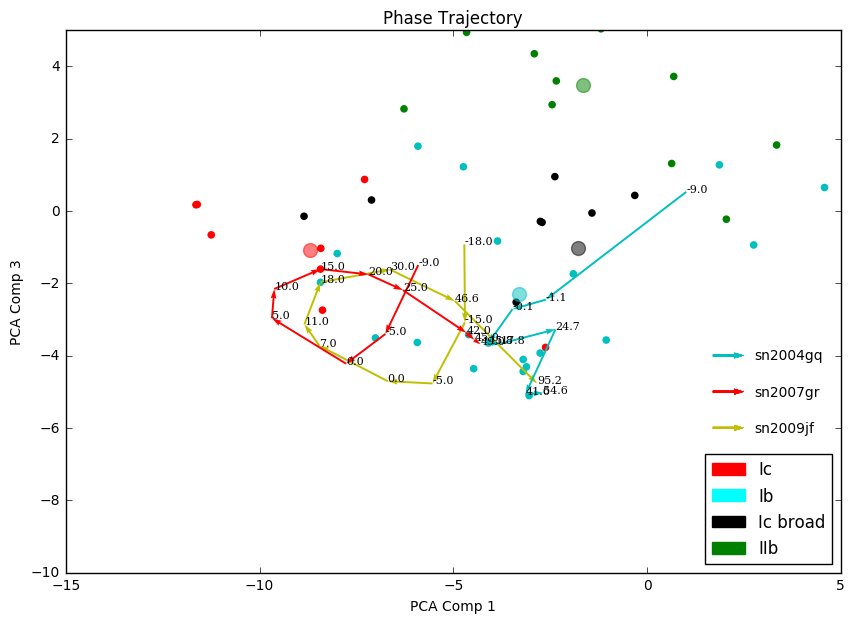

In [635]:
fig, ax = plt.subplots(figsize=(10,7))

pca_x = 1
pca_y = 3

#old_09jf_col = colors[np.where(Ib_Ic_names=='sn2009jf')[0][0]]
#colors[np.where(Ib_Ic_names=='sn2009jf')[0][0]] = 'y'
x = spectra_pca_matrix[:,pca_x]
y = spectra_pca_matrix[:,pca_y]
plt.scatter(x,y,color=colors)
#colors[np.where(Ib_Ic_names=='sn2009jf')[0][0]] = old_09jf_col

font = {'family': 'serif',
        'color':  'k',
        'weight': 'normal',
        'size': 8,
        }


snid_col = ['y','r','c']
for i,snid_phase_pca_mat in enumerate(snid_phase_pca_list):
    snid_phase_x = snid_phase_pca_mat[:,pca_x]
    snid_phase_y = snid_phase_pca_mat[:,pca_y]
    QV = plt.quiver(snid_phase_x[:-1], snid_phase_y[:-1], snid_phase_x[1:]-snid_phase_x[:-1], 
           snid_phase_y[1:]-snid_phase_y[:-1], color=snid_col[i],width=.005/2,scale_units='xy', angles='xy', scale=1)
    plt.quiverkey(QV, 2.5, -6+i, .8, label=snid_list[i],coordinates='data',labelpos='E')
    
    snid_phases = snid_phase_list[i]
    for j,ph in enumerate(snid_phases):
        plt.text(x=snid_phase_x[j], y=snid_phase_y[j],s=str(ph),fontdict=font)
    
#for j,snid_phases in enumerate(snid_phase_list):
#    for i,ph in enumerate(snid_phases):
#        plt.text(x=snid_phase_x[i], y=snid_phase_y[i],s=str(ph),fontdict=font)


#for i, txt in enumerate(Ib_Ic_names):
#    ax.annotate(txt,(spectra_pca_matrix[:,2][i],spectra_pca_matrix[:,4][i]))


for col in colors_types:
    tmp_mask = colors==col
    xmean = np.mean(x[tmp_mask])
    ymean = np.mean(y[tmp_mask])
    plt.scatter(xmean, ymean, color=col, alpha=.5, s=100)

plt.xlabel('PCA Comp %d'%(pca_x))
plt.ylabel('PCA Comp %d'%(pca_y))
plt.xlim((-15,5))
plt.ylim((-10,5))

red_patch = mpatches.Patch(color='red', label='Ic')
cyan_patch = mpatches.Patch(color='cyan', label='Ib')
black_patch = mpatches.Patch(color='black', label='Ic broad')
green_patch = mpatches.Patch(color='green', label='IIb')
#yellow_patch = mpatches.Patch(color='yellow', label='sn2009jf')

plt.legend(handles=[red_patch, cyan_patch, black_patch, green_patch],loc='lower right')
plt.title('Phase Trajectory')


from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
#axins = zoomed_inset_axes(ax, 2.5, loc=1) # zoom-factor: 2.5, location: upper-left

#x1, x2, y1, y2 = 5, 10, -7, -3 # specify the limits (use for pca 2 vs pca 4)
x1, x2, y1, y2 = -10, -6, -3, 0.5 # specify the limits (rogue in Ic)
#x1, x2, y1, y2 = -4, -2, -5, -2 # specify the limits (rogue in Ib)
#x1, x2, y1, y2 = 5, 10, -2, 2# specify the limits (rogue in Ib)



#xzoom = np.logical_and(x>x1, x<x2)
#yzoom = np.logical_and(y>y1,y<y2)
#zoom_mask = np.logical_and(xzoom, yzoom)


#for i, txt in enumerate(Ib_Ic_names[zoom_mask]):
#    axins.annotate(txt,(x[zoom_mask][i],y[zoom_mask][i]))


#axins.scatter(spectra_pca_matrix[:,pca_x][zoom_mask],spectra_pca_matrix[:,pca_y][zoom_mask],color=colors[zoom_mask])

for col in colors_types:
    tmp_mask = colors==col
    xmean = np.mean(x[tmp_mask])
    ymean = np.mean(y[tmp_mask])
    axins.scatter(xmean, ymean, color=col, alpha=.5, s=100)


#axins.set_xlim(x1, x2) # apply the x-limits
#axins.set_ylim(y1, y2) # apply the y-limits




#plt.yticks(visible=False)
#plt.xticks(visible=False)

from mpl_toolkits.axes_grid1.inset_locator import mark_inset
#mark_inset(ax, axins, loc1=2, loc2=4, fc="none", ec="0.5")
plt.savefig('plots/phase_trajectory_phase15pm5.png')
#fig

# HEI 5876 velocities

In [159]:
with open('apjaa2759t3_mrt.txt', 'r') as table:
    lines = table.readlines()
    lines = lines[32:]

In [207]:
table_SNids = []
table_SN_phases = []
table_SN_HEIvels = []
phase = 15.0

for line in lines:
    sn_id = line[0:9].strip()
    sn_phase = float(line[14:19].strip())
    
    sn_HEIvel = line[20:26].strip()
    has_HEIvel = sn_HEIvel != ''
    if has_HEIvel:
        sn_HEIvel = float(sn_HEIvel)
    
    if (np.abs(sn_phase - phase)<= 5.0) and sn_HEIvel:
        if sn_id in table_SNids:
            oldidx = table_SNids.index(sn_id)
            oldphase = table_SN_phases[oldidx]
            olddist = np.abs(oldphase - phase)
            newdist = np.abs(sn_phase - phase)
            
            if newdist < olddist:
                table_SN_phases[oldidx] = sn_phase
                table_SN_HEIvels[oldidx] = sn_HEIvel
            
        else:
        
            table_SNids.append(sn_id)
            table_SN_phases.append(sn_phase)
            table_SN_HEIvels.append(sn_HEIvel)
        
table_SNids = np.array(table_SNids)
table_SN_phases = np.array(table_SN_phases)
table_SN_HEIvels = np.array(table_SN_HEIvels)

In [208]:
table_SN_HEIvels.shape

(28,)

In [209]:
table_SNids

array(['sn1983N', 'sn1984L', 'sn1990I', 'sn1990U', 'sn1998dt', 'sn1999dn',
       'sn2004dk', 'sn2004gq', 'sn2004gv', 'sn2005hg', 'sn2006ep',
       'sn2007C', 'sn2007Y', 'sn2008D', 'sn2009iz', 'sn2009jf', 'sn1993J',
       'sn1998fa', 'sn2000H', 'sn2003bg', 'sn2006el', 'sn2006T',
       'sn2008ax', 'sn2008bo', 'sn2009mg', 'sn2011dh', 'sn2011ei',
       'sn2011fu'], 
      dtype='|S8')

In [210]:
table_SN_phases

array([ 12. ,  12. ,  11.3,  12. ,  13.6,  13.5,  14.2,  15.8,  15.3,
        16.7,  12.5,  13.8,  12.8,  14.2,  13.2,  18. ,  12.5,  18.3,
        15. ,  16. ,  15.8,  14.3,  15. ,  15.8,  13.8,  15.4,  13. ,  17. ])

In [223]:
table_SN_HEIvels

array([-10200.,  -9240., -13000.,  -7830., -11700.,  -9800., -11000.,
       -13100., -10500.,  -9290.,  -9410.,  -7930.,  -8240., -10400.,
        -9540.,  -7710.,  -7180.,  -7080.,  -9910.,  -8190.,  -8740.,
        -7390.,  -8190.,  -7160.,  -7470.,  -8310.,  -9330.,  -6190.])

In [211]:
ib_pec = ['sn1998dt', 'sn1990I', 'sn2004gq', 'sn2009er', 'sn2007uy']
mask = np.array([sn in ib_pec for sn in Ib_Ic_names])


In [229]:
table_mask = np.array([sn in ib_pec for sn in table_SNids])
print table_SN_HEIvels[table_mask]
print table_SNids[table_mask]
print table_SN_phases[table_mask]

[-13000. -11700. -13100.]
['sn1990I' 'sn1998dt' 'sn2004gq']
[ 11.3  13.6  15.8]


In [212]:
print Ib_Ic_names[mask]
phase_arr[mask]

['sn2009er' 'sn1990I' 'sn1998dt' 'sn2004gq' 'sn2007uy']


array([ 15.4,  11.3,  13.6,  15.8,  12.6])

In [215]:
col = ['r' if sn in ib_pec else 'b' for sn in table_SNids]

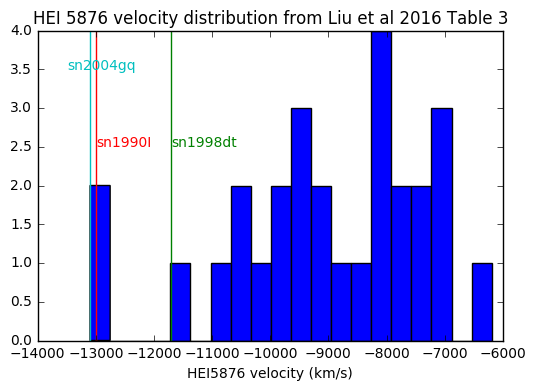

In [254]:
from matplotlib.text import Text
plt.hist(table_SN_HEIvels,bins=20)
plt.xlabel("HEI5876 velocity (km/s)")
plt.title("HEI 5876 velocity distribution from Liu et al 2016 Table 3")


plt.axvline(x=-13000,c='r')
plt.text(-13000,2.5,'sn1990I',fontdict={'color':'r'})

plt.axvline(x=-11700,c='g')
plt.text(-11700,2.5,'sn1998dt',fontdict={'color':'g'})


plt.axvline(x=-13100,c='c')
plt.text(-13500,3.5,'sn2004gq',fontdict={'color':'c'})


plt.savefig('plots/HEI5876_phase15pm5.png')

In [247]:
import matplotlib
lab = matplotlib.text.Text(-13000,2.5,'test',color='r')

In [145]:
Ib_Ic_names

array(['sn2009er', 'sn2007gr', 'sn2004dk', 'sn2010ay', 'sn1999dn',
       'sn2011ei', 'sn1990I', 'sn2011dh', 'sn2006T', 'sn1998dt', 'sn1983N',
       'sn2005hg', 'sn2009iz', 'sn2003bg', 'sn2013dx', 'sn2006aj',
       'sn2007C', 'sn1994I', 'sn2004gq', 'sn1993J', 'sn2004ge', 'sn1997ef',
       'sn2005az', 'sn2007uy', 'sn2004aw', 'sn2004gv', 'sn1998bw',
       'sn04aw_bsnip', 'sn2005la', 'PTF10qts', 'sn2010bh', 'sn2005E',
       'sn2007Y', 'sn2009bb', 'sn2007bg', 'sn2000H', 'sn2006jc',
       'sn2011fu', 'sn1990U', 'sn2004gt', 'sn2011bm', 'sn2006el',
       'sn2009mg', 'sn2008ax', 'sn2008bo', 'sn2006ep', 'sn2009jf',
       'sn2008D', 'sn2003jd'], 
      dtype='|S12')

In [146]:
phase_arr

array([ 15.4 ,  15.  ,  15.96,  10.4 ,  14.2 ,  15.7 ,  13.  ,  13.  ,
        11.3 ,  15.4 ,  14.  ,  14.3 ,  13.6 ,  12.  ,  15.8 ,  12.9 ,
        14.1 ,  15.5 ,  13.4 ,  10.6 ,  13.8 ,  11.06,  15.8 ,  16.5 ,
        12.2 ,  15.7 ,  17.3 ,  12.6 ,  12.2 ,  15.  ,  16.8 ,  12.2 ,
        16.  ,  15.4 ,  15.2 ,  17.1 ,  15.4 ,  12.7 ,  11.  ,  12.8 ,
        14.6 ,  18.5 ,  16.8 ,  15.5 ,  17.  ,  11.9 ,  16.4 ,  18.3 ,
        12.9 ,  16.4 ,  15.5 ,  13.8 ,  15.  ,  15.7 ,  11.6 ,  18.  ,
        14.2 ,  18.8 ,  11.9 ])

In [147]:
He5876_vel = []

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
  True False False False False False False False False False False False
 False]
[  3.27817330e-02  -1.22055947e-01   7.05470209e-02   3.65582618e-02
  -8.99554527e-02  -2.71228835e-01  -1.18279419e-01  -2.00896701e-02
   5.92174345e-02  -1.08838097e-01  -1.63597764e-01   1.04535780e-01
   1.32859746e-01   1.95172471e-01   2.68814782e-01   3.40568829e-01
   3.67004531e-01   1.63071976e-01   7.99883429e-02   1.40412804e-01
   9.88709868e-02   1.19641895e-01  -4.98355494e-03  -3.33075209e-02
   3.65582618e-02  -8.42906596e-02   1.38990890e-02  -1.20702615e-03
   8.23429583e-03   6.86587565e-02   5.35526413e-02   1.53630654e-01
   1.08312309e-01  -1.27720741e-01  -2.19779345e-02  -6.72962800e-02
  -8.24023952e-02  -1.63131413e-02  -4.27488429e-02  -7.67376020e-02
  -8.61789

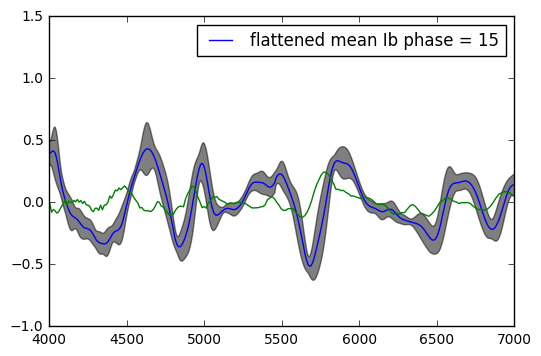

In [148]:
from scipy.io.idl import readsav
tp='Ib'
s = readsav('PCvsTemplates/meanspec%s_1specperSN_15.sav'%tp)
plt.fill_between(s.wlog, s.fmean + s.fsdev, s.fmean - s.fsdev, 
                    color = 'k', alpha = 0.5)
plt.plot(s.wlog, s.fmean, label="flattened mean %s phase = 15"%tp)


#sp = 'sn1983N'
sp='sn2006jc'
m = Ib_Ic_names==sp
print m
print spectra_matrix[m][0]
#plt.plot(wavelengths,spectra_matrix[m][0]/np.max(spectra_matrix[m][0]))
plt.plot(wavelengths,evecs[2])
plt.xlim((4000,7000))
plt.legend()



In [149]:
#Ib_mask = colors=='c'
Ib_comp2_sub = np.logical_and(Ib_mask,spectra_pca_matrix[:,2]>5)
Ib_comp2_norm = np.logical_and(Ib_mask, spectra_pca_matrix[:,2]<5)

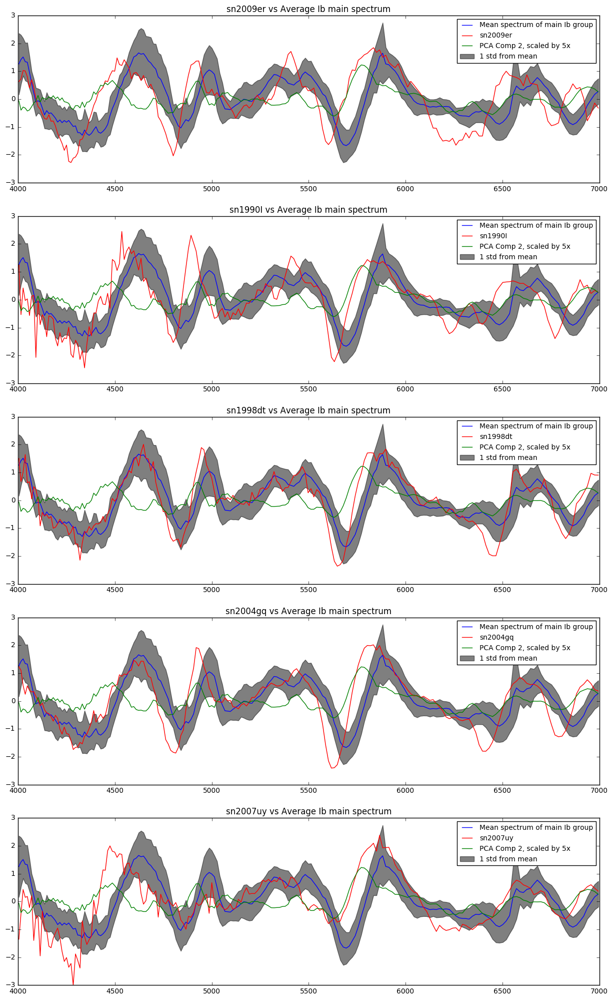

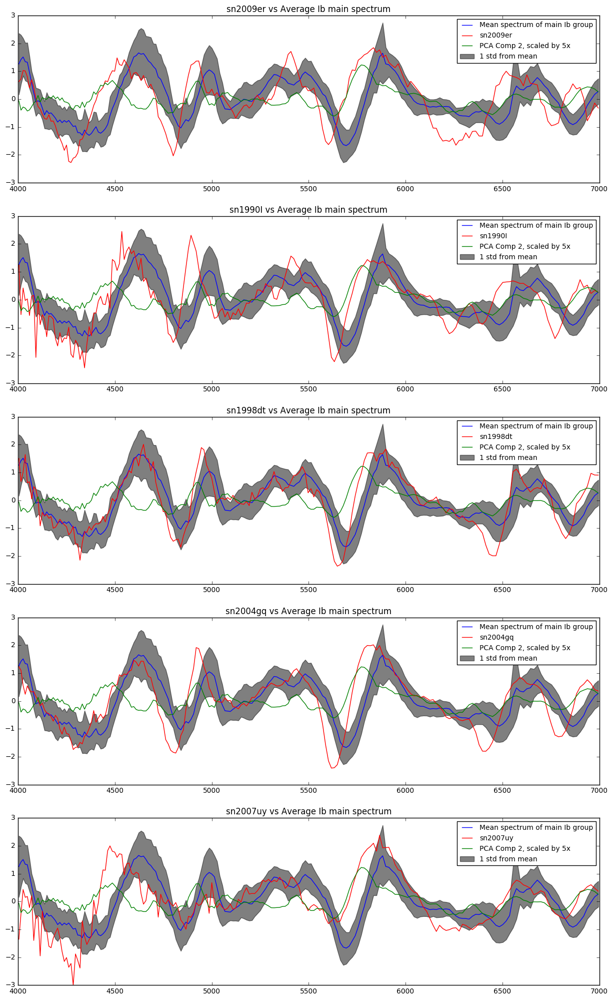

In [150]:
Ib_norm_mean_spec = np.mean(spectra_matrix[Ib_comp2_norm],axis=0)
Ib_norm_std_spec = np.std(spectra_matrix[Ib_comp2_norm],axis=0)

names = Ib_Ic_names[np.logical_and(zoom_mask,Ib_mask)]

f=plt.figure(figsize=(15,25))
for i,name in enumerate(names):
    plt.subplot(5,1,i+1)
    plt.plot(wavelengths, Ib_norm_mean_spec, color='b', label='Mean spectrum of main Ib group')
    plt.fill_between(wavelengths[:,0], Ib_norm_mean_spec + Ib_norm_std_spec, Ib_norm_mean_spec - Ib_norm_std_spec, 
                     color='k', alpha=0.5, label='1 std from mean')
    m = Ib_Ic_names==name
    plt.plot(wavelengths,spectra_matrix[m][0],color='r',label=name)
    plt.plot(wavelengths,5*evecs[2],color='g',label='PCA Comp 2, scaled by 5x')
    plt.legend(loc='upper right',prop={'size':10})
    plt.title(name+' vs Average Ib main spectrum')
    
#f.savefig('plots/Ib_subtype_phase15pm5.png')
f

In [151]:
spectra_pca_matrix.shape

(49, 49)

# Reconstruct Spectra with PCA

In [152]:
def reconstruct_SN_type(pca_spec_mat, spec_names, ncomp, col, sn_type, threshhold=None, fig=None, ax=None):
    if threshhold!=None:
        bar_y = []
        for spec in pca_spec_mat:
            for i in range(spectra_pca_matrix.shape[1]):
                perc_reconstruct = percent_reconstruct(spec, i)
                if perc_reconstruct > threshhold:
                    bar_y.append(i)
                    break
        bar_y = np.array(bar_y)
        ylabel = '# of PCA Components'
        title = 'SNe '+sn_type+' Reconstruct to %.2f Accuracy'%(threshhold)
        
    else:
        bar_y = []
        for spec in pca_spec_mat:
            perc_reconstruct = percent_reconstruct(spec, ncomp)
            bar_y.append(perc_reconstruct)
        bar_y = np.array(bar_y)
        ylabel = 'Percent of spectrum reconstructed'
        title = 'SNe '+sn_type+' with %d components'%(ncomp)

    
    x_loc = np.arange(1,pca_spec_mat.shape[0]+1)
    width = 0.8
    if fig==None or ax==None:
        fig, ax = plt.subplots(figsize=(10,10))
    rects = ax.bar(x_loc, bar_y, width, color=col)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.set_xticks(x_loc + width / 2.0)
    ax.set_xticklabels(spec_names,rotation=60)
    ax.set_xlim((0,x_loc[-1]))
    if threshhold!=None:
        ax.set_ylim((0,bar_y.max()))
    else:
        ax.set_ylim((0,1))
    return fig, ax

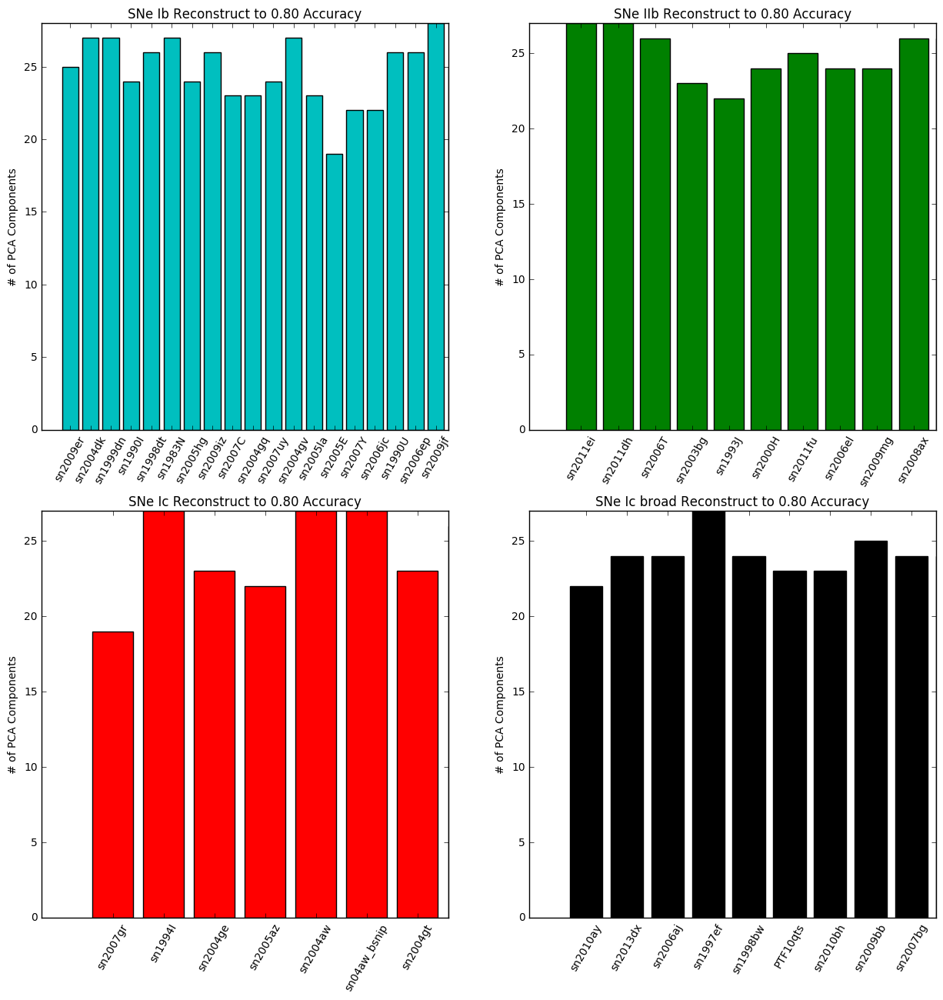

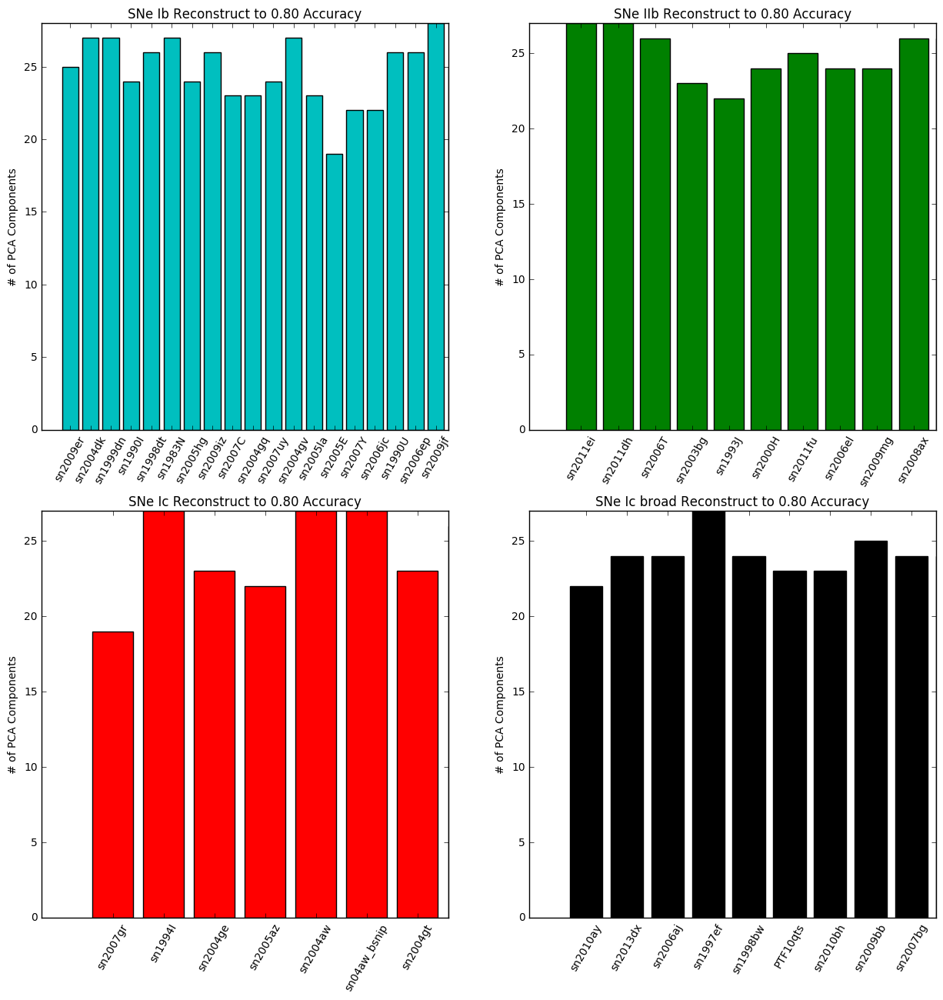

In [153]:
bar_fig, ax_arr = plt.subplots(2,2,figsize=(15,15))
ncomp_bar = 3
thresh_bar = .8

f,a = reconstruct_SN_type(spectra_pca_matrix[Ib_mask], Ib_Ic_names[Ib_mask], ncomp=ncomp_bar, 
                          threshhold=thresh_bar, col='c', sn_type='Ib',fig=bar_fig,ax=ax_arr[0,0])

f,a = reconstruct_SN_type(spectra_pca_matrix[IIb_mask], Ib_Ic_names[IIb_mask], ncomp=ncomp_bar, 
                          threshhold=thresh_bar, col='g', sn_type='IIb',fig=bar_fig,ax=ax_arr[0,1])

f,a = reconstruct_SN_type(spectra_pca_matrix[Ic_mask], Ib_Ic_names[Ic_mask], ncomp=ncomp_bar, 
                          threshhold=thresh_bar, col='r', sn_type='Ic',fig=bar_fig,ax=ax_arr[1,0])

f,a = reconstruct_SN_type(spectra_pca_matrix[Ic_broad_mask], Ib_Ic_names[Ic_broad_mask], ncomp=ncomp_bar, 
                          threshhold=thresh_bar, col='k', sn_type='Ic broad',fig=bar_fig,ax=ax_arr[1,1])


#bar_fig.savefig('plots/Reconstruct_PCA_thresh80_ph0pm5.png')
bar_fig

In [54]:
spec_name_list = list(Ib_Ic_names[Ic_broad_mask])
spec_name_list.append('sn1993J')
spec_name_list.append('sn2011dh')
spec_name_list.append('iPTF13bvn')
spec_name_list.append('sn1994I')
spec_name_list = np.array(spec_name_list)
spec_name_list_idx = np.array([np.where(Ib_Ic_names==sp)[0][0] for sp in spec_name_list])

In [55]:
spec_name_list

array(['sn2010ay', 'sn2013dx', 'sn2006aj', 'sn1997ef', 'sn1998bw',
       'PTF10qts', 'sn2010bh', 'sn2009bb', 'sn2007bg', 'sn2003jd',
       'sn1993J', 'sn2011dh', 'iPTF13bvn', 'sn1994I'], 
      dtype='|S9')

['sn2010ay' 'sn2013dx' 'sn2006aj' 'sn1997ef' 'sn1998bw' 'PTF10qts'
 'sn2010bh' 'sn2009bb' 'sn2007bg' 'sn2003jd' 'sn1993J' 'sn2011dh'
 'iPTF13bvn' 'sn1994I']
[ 3 14 15 21 26 29 30 33 34 49 19  7 39 17]
[0, 4, 8, 20, 50]
(50, 207)
(207,)
(50, 207)
(207,)
(50, 207)
(207,)
(50, 207)
(207,)
(50, 207)
(207,)
(50, 207)
(207,)
(50, 207)
(207,)
(50, 207)
(207,)
(50, 207)
(207,)
(50, 207)
(207,)
(50, 207)
(207,)
(50, 207)
(207,)
(50, 207)
(207,)
(50, 207)
(207,)


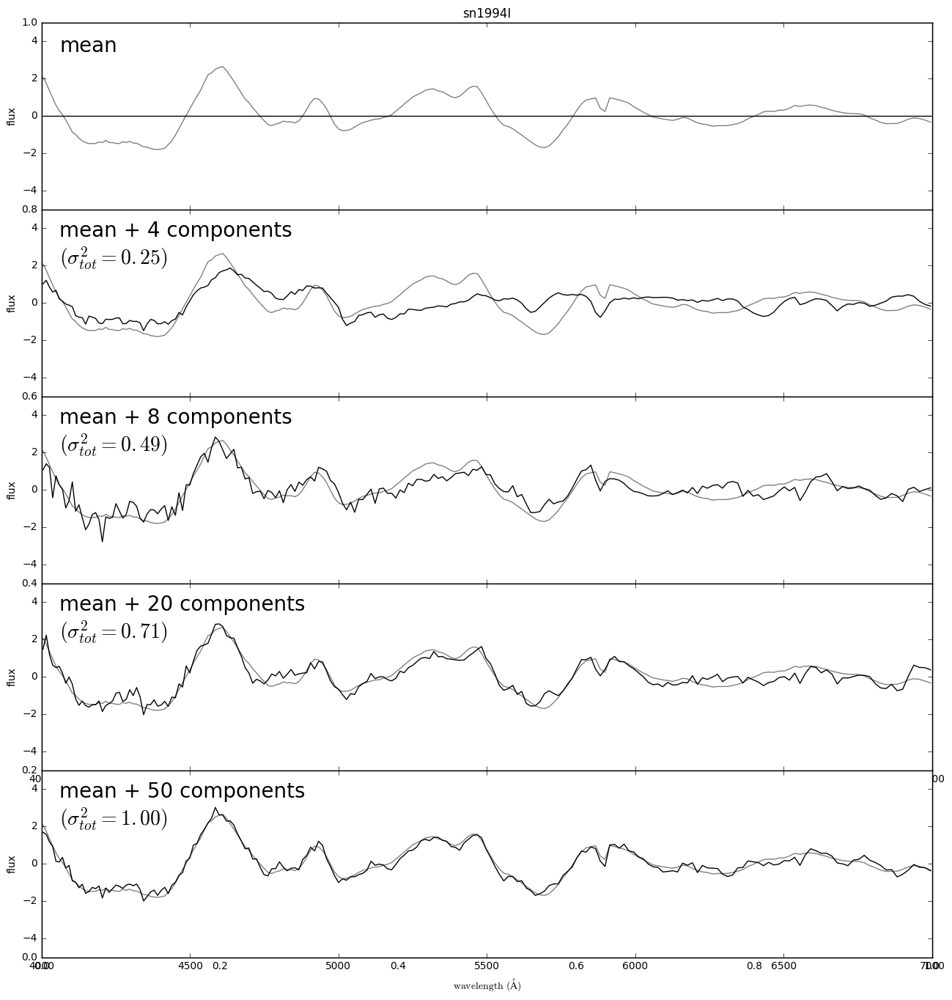

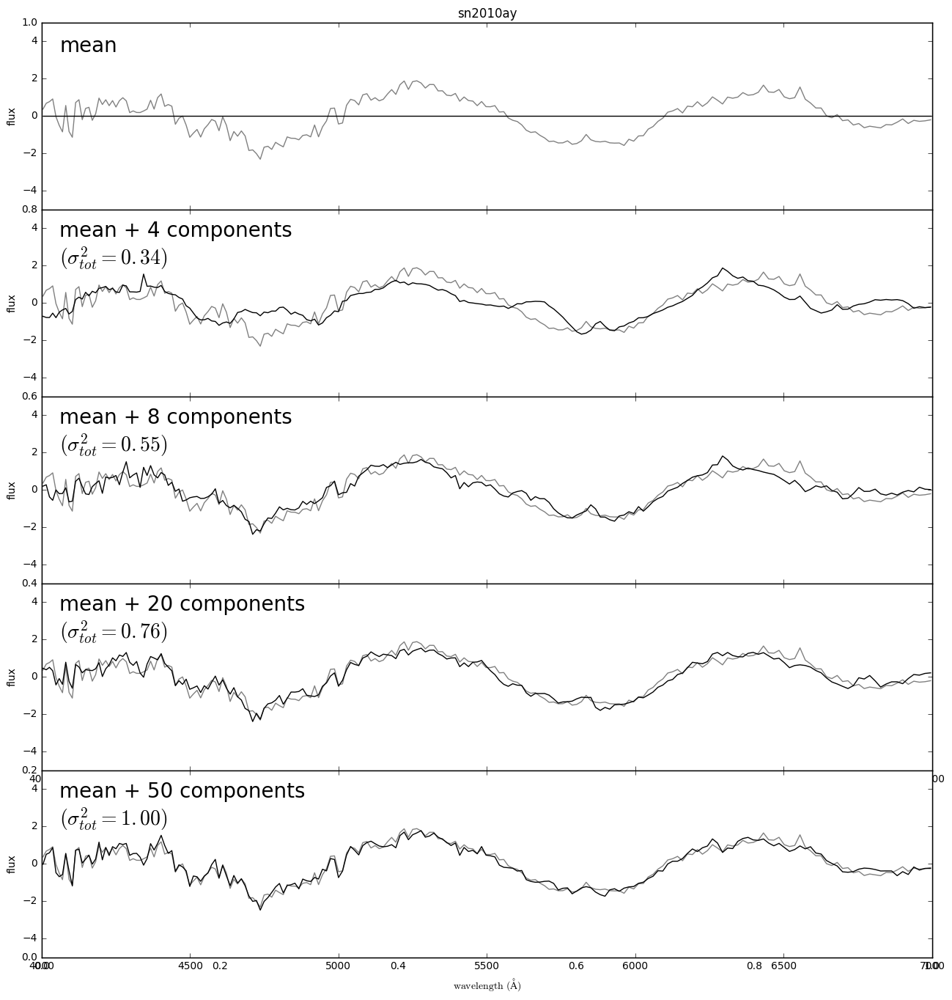

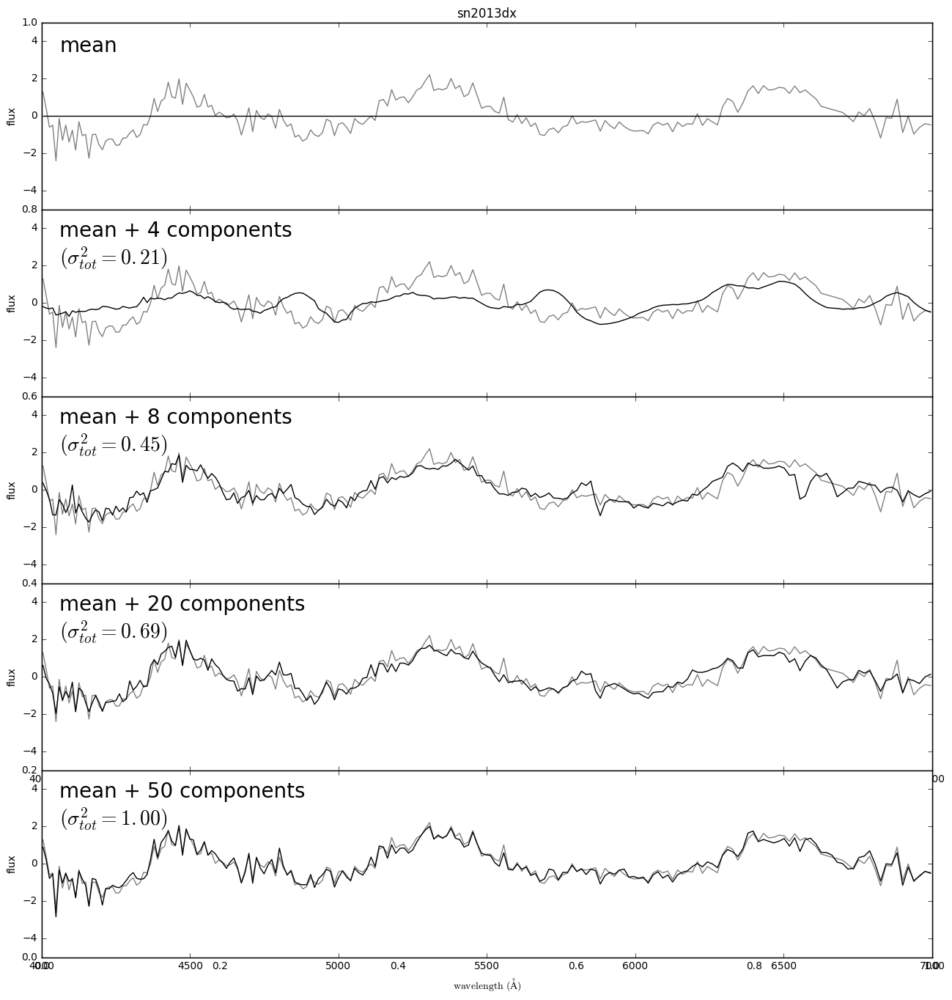

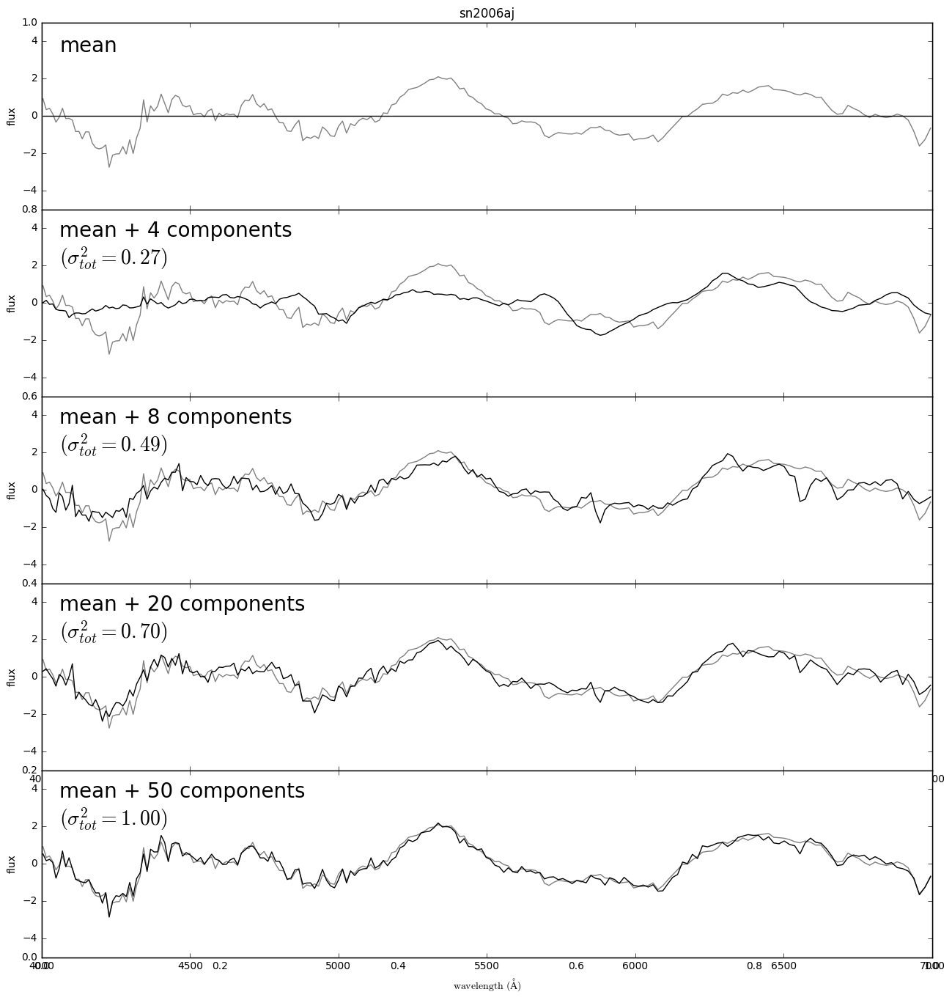

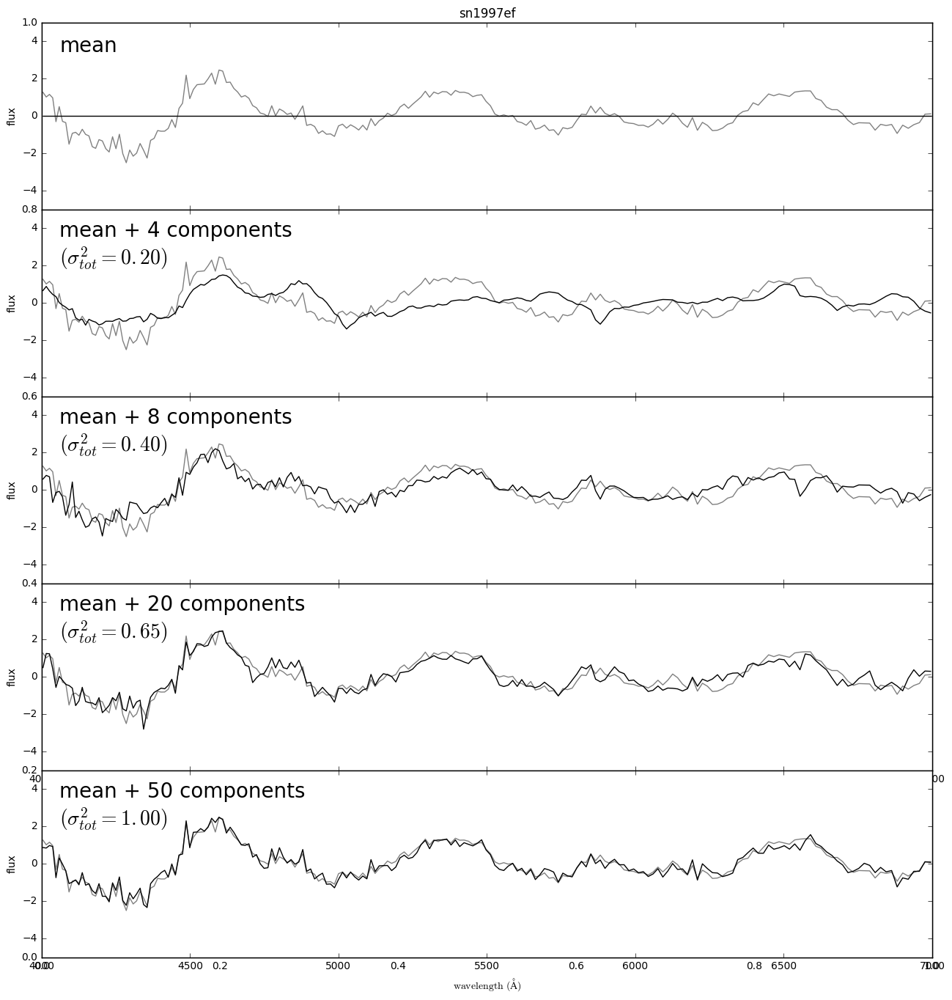

...

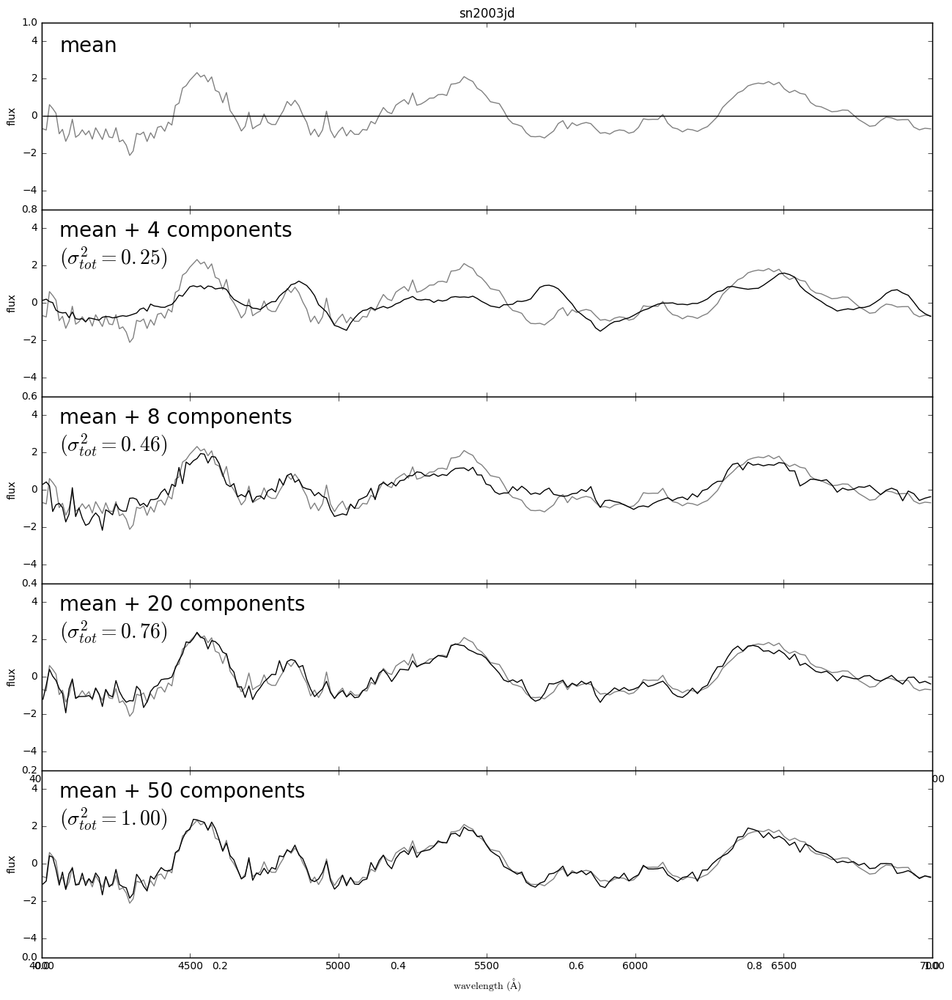

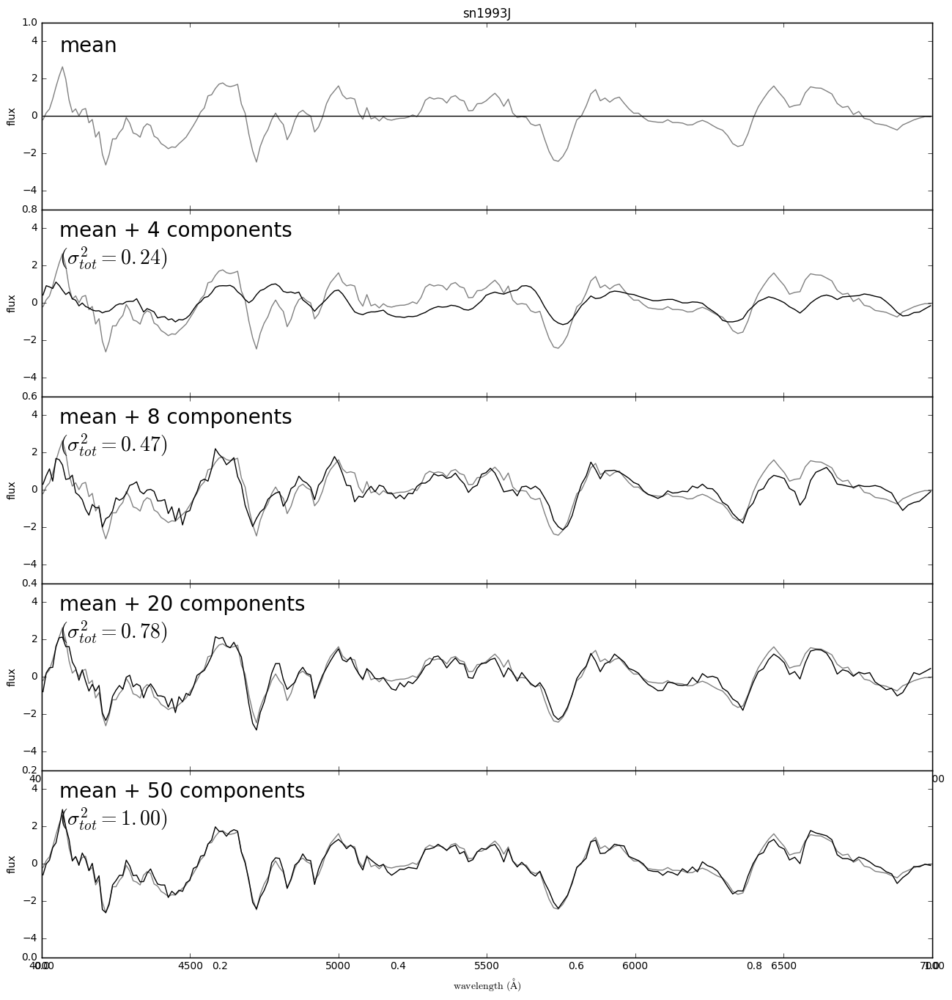

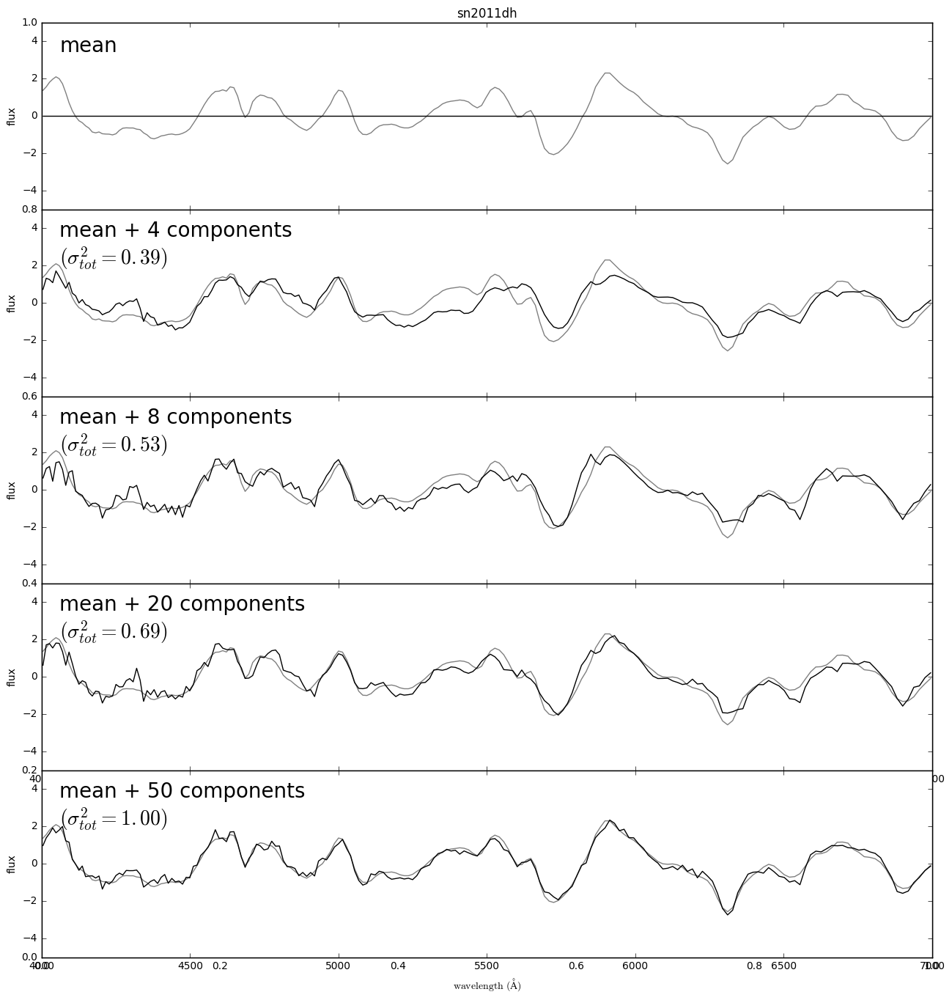

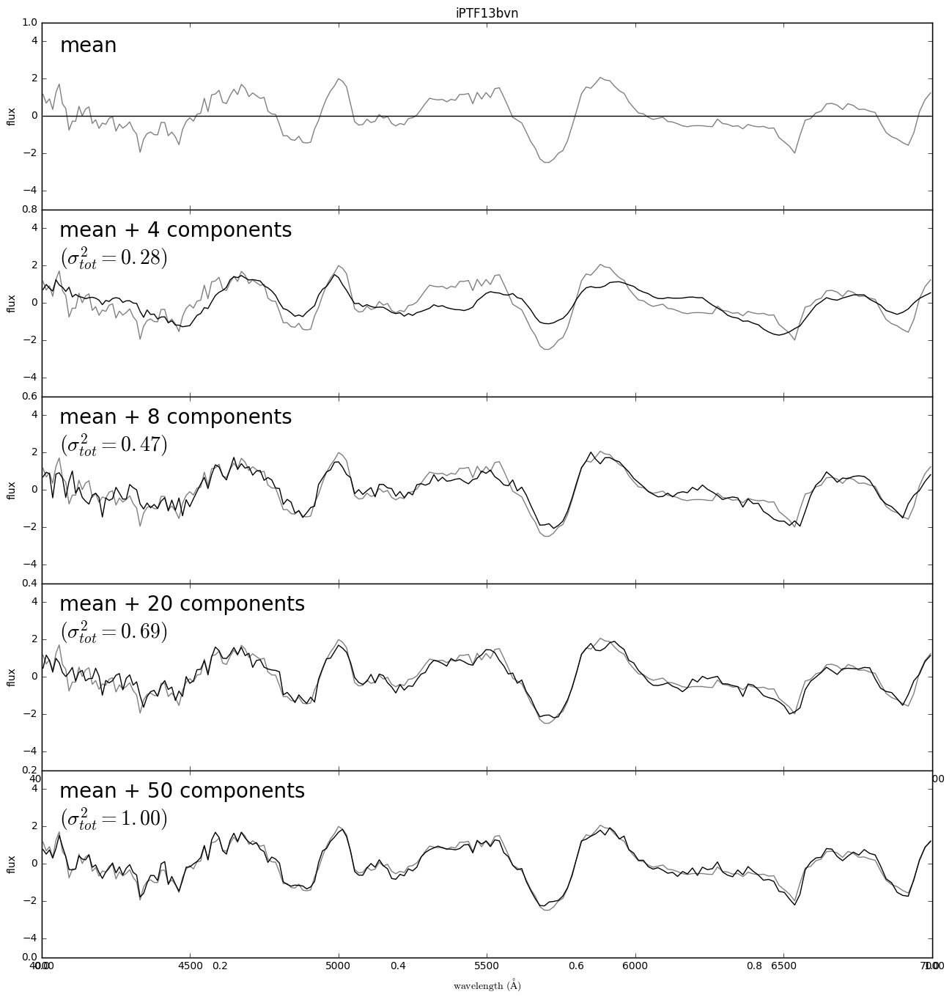

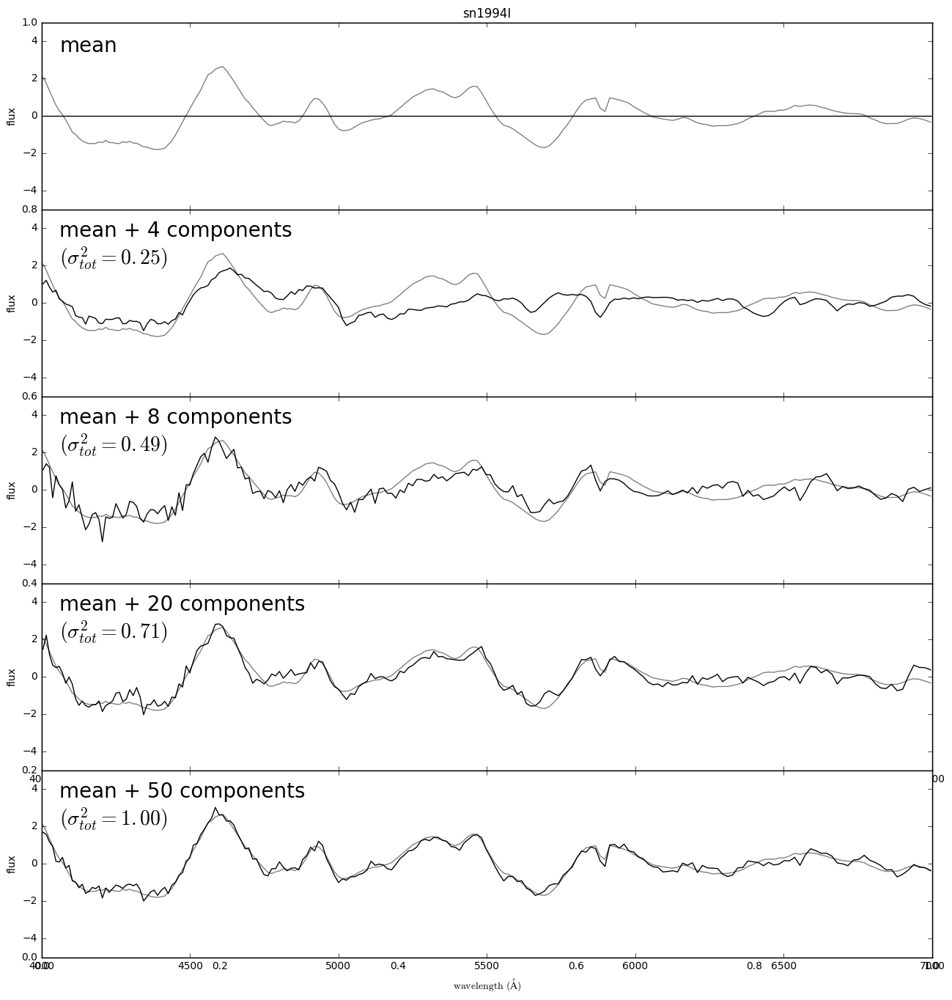

In [56]:
%matplotlib inline  
print spec_name_list
print spec_name_list_idx
n_pca_components = [0,4,8,20,n_evecs]
print n_pca_components

for j,spec in enumerate(spec_name_list_idx):
    spec_name = Ib_Ic_names[spec]
    true_spec = spectra_matrix[spec]
    
    print evecs.shape
    print spectra_matrix[spec].shape
    pca_coeff = np.dot(evecs, spectra_matrix[spec])
    
    
    #------------------------------------------------------------
    # Plot the sequence of reconstructions
    fig = plt.figure(j, figsize=(15, 15))
    plt.title(spec_name)
    fig.subplots_adjust(hspace=0, top=0.95, bottom=0.1, left=0.12, right=0.93)

    for i, n in enumerate(n_pca_components):#, len(pca.components_)]):
        ax = fig.add_subplot(511 + i)
        ax.plot(wavelengths, true_spec, '-', c='gray')
        ax.plot(wavelengths, (np.dot(pca_coeff[:n], evecs[:n])), '-k')
        
        if i < 3:
            ax.xaxis.set_major_formatter(plt.NullFormatter())
            
        ax.set_ylim(-5, 5)
        ax.set_ylabel('flux')

        if n == 0:
            text = "mean"
        elif n == 1:
            text = "mean + 1 component\n"
            #text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
            text += r"$(\sigma^2_{tot} = %.2f)$" % percent_reconstruct(pca_coeff,n)
        else:
            text = "mean + %i components\n" % n
            #text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
            text += r"$(\sigma^2_{tot} = %.2f)$" % percent_reconstruct(pca_coeff,n)
            
        ax.text(0.02, 0.93, text, fontsize=20,ha='left', va='top', transform=ax.transAxes)

        fig.axes[-1].set_xlabel(r'${\rm wavelength\ (\AA)}$')

#fig.savefig('plots/PCA_spec_recreate_phase15pm5.png')
fig

In [57]:
Ib_Ic_names

array(['sn2009er', 'sn2007gr', 'sn2004dk', 'sn2010ay', 'sn1999dn',
       'sn2011ei', 'sn1990I', 'sn2011dh', 'sn2006T', 'sn1998dt', 'sn1983N',
       'sn2005hg', 'sn2009iz', 'sn2003bg', 'sn2013dx', 'sn2006aj',
       'sn2007C', 'sn1994I', 'sn2004gq', 'sn1993J', 'sn2004ge', 'sn1997ef',
       'sn2005az', 'sn2007uy', 'sn2004aw', 'sn2004gv', 'sn1998bw',
       'sn04aw_bsnip', 'sn2005la', 'PTF10qts', 'sn2010bh', 'sn2005E',
       'sn2007Y', 'sn2009bb', 'sn2007bg', 'sn2000H', 'sn2006jc',
       'sn2011fu', 'sn1990U', 'iPTF13bvn', 'sn2004gt', 'sn2011bm',
       'sn2006el', 'sn2009mg', 'sn2008ax', 'sn2008bo', 'sn2006ep',
       'sn2009jf', 'sn2008D', 'sn2003jd'], 
      dtype='|S12')

# TSNE

In [590]:
from sklearn.manifold import TSNE
from mpl_toolkits.mplot3d import Axes3D

ncomp_tsne = 2
model = TSNE(n_components=ncomp_tsne, random_state=0)

tsne_spec = model.fit_transform(spectra_pca_matrix)

plt.figure(j, figsize=(15, 15))
for i in range(ncomp_tsne):
    for j in range(ncomp_tsne):
        if i > j:
            plot_number = ncomp_tsne*i+j+1
            plt.subplot(ncomp_tsne,ncomp_tsne,plot_number)
            x = tsne_spec[:,i]
            y = tsne_spec[:,j]
            print "(x,y) shape is (%d,%d)"%(len(x),len(y))
            plt.scatter(y,x,color=colors)
            plt.xlim((np.min(tsne_spec[:,j])-2,np.max(tsne_spec[:,j])+2))
            plt.ylim((np.min(tsne_spec[:,i])-2,np.max(tsne_spec[:,i])+2))
            #plt.xlim((-5,5))
            #plt.ylim((-5,5))
            if j==0:
                plt.ylabel('TSNE Comp %d'%(i))
            if i==ncomp_tsne-1:
                plt.xlabel('TSNE Comp %d'%(j))
plt.title('TSNE Projection from PCA')
#plt.savefig('TSNE.pdf')

# Simple ICA

### We perform ICA on the original spectra (ie no PCA has been run, either for whitening or dimension reduction)

In [93]:
print spectra_pca_matrix.shape

(49, 49)


In [94]:
from sklearn.decomposition import FastICA
ica_dim = 8
ica = FastICA(n_components=ica_dim, whiten=False, max_iter=1000)
ica_src_spec_matrix = ica.fit_transform(spectra_pca_matrix[:,:ica_dim])

/home/data/mew488/virtualenvs/mypy2.7/lib/python2.7/site-packages/sklearn/decomposition/fastica_.py:290: UserWarning:

Ignoring n_components with whiten=False.



In [95]:
print spectra_matrix.shape
print ica_src_spec_matrix.shape

(49, 207)
(49, 8)


(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)
(x,y) shape is (49,49)


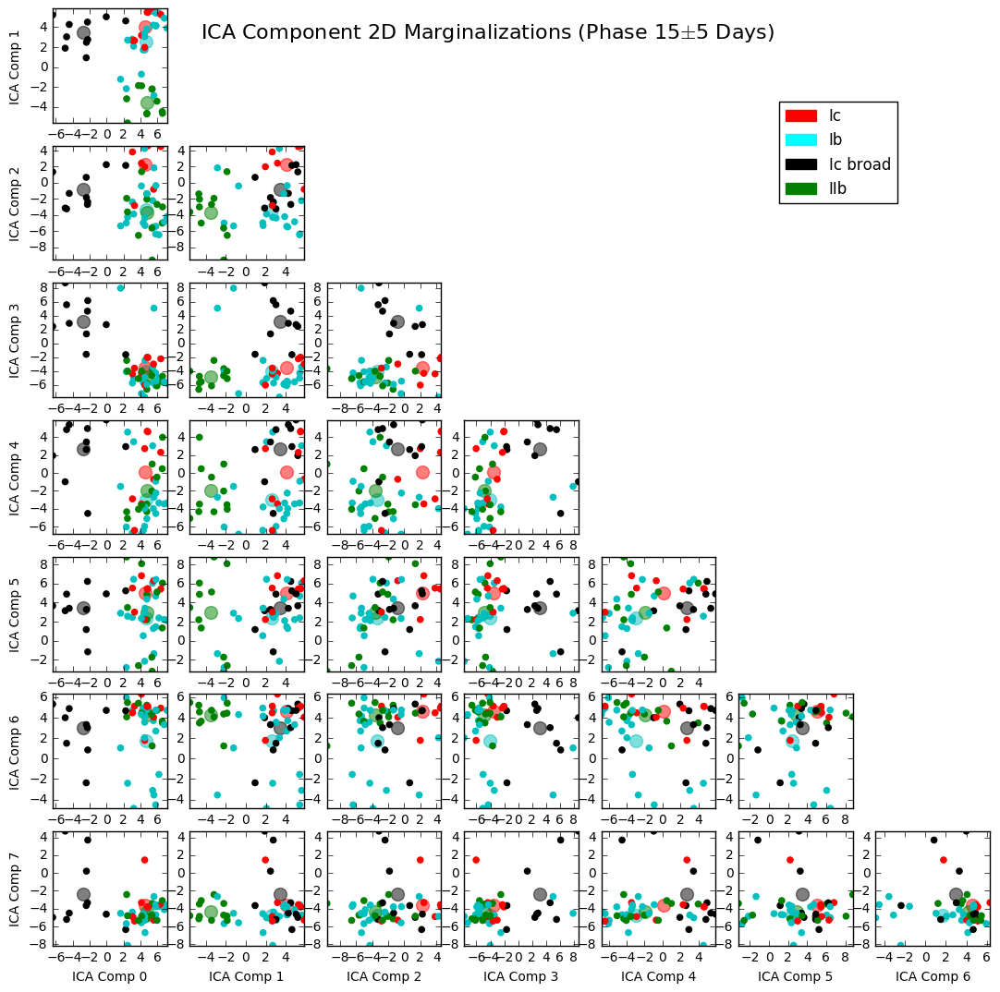

In [96]:
red_patch = mpatches.Patch(color='red', label='Ic')
cyan_patch = mpatches.Patch(color='cyan', label='Ib')
black_patch = mpatches.Patch(color='black', label='Ic broad')
green_patch = mpatches.Patch(color='green', label='IIb')

colors_types = ['c', 'r', 'k', 'g']

ncomp = ica_dim
plt.figure(figsize=(15, 15))
for i in range(ncomp):
    for j in range(ncomp):
        if i > j:
            plot_number = ncomp*i+j+1
            plt.subplot(ncomp,ncomp,plot_number)
            x = ica_src_spec_matrix[:,i][color_mask]
            y = ica_src_spec_matrix[:,j][color_mask]
            
            for col in colors_types:
                tmp_mask = colors==col
                xmean = np.mean(x[tmp_mask])
                ymean = np.mean(y[tmp_mask])
                plt.scatter(ymean, xmean, color=col, alpha=.5, s=100)
            
            print "(x,y) shape is (%d,%d)"%(len(x),len(y))
            plt.scatter(y,x,color=colors[color_mask],alpha=1)
            plt.xlim((np.min(ica_src_spec_matrix[:,j]),np.max(ica_src_spec_matrix[:,j])))
            plt.ylim((np.min(ica_src_spec_matrix[:,i]),np.max(ica_src_spec_matrix[:,i])))
            #plt.xlim((-5,5))
            #plt.ylim((-5,5))
            if j==0:
                plt.ylabel('ICA Comp %d'%(i))
            if i==ncomp-1:
                plt.xlabel('ICA Comp %d'%(j))

                
                
plt.subplot(5,5,9)
plt.axis('off')
plt.legend(handles=[red_patch, cyan_patch, black_patch, green_patch])
plt.text(-2.8,1.3,'ICA Component 2D Marginalizations (Phase 15$\pm$5 Days)',fontsize=16)

plt.savefig('plots/ICA_2Dcomp_phase15pm5.png')

In [102]:
ica_src_spec_matrix[0]

array([ 3.19116055,  2.08183   , -3.89701615, -5.08725243,  3.46835946,
        6.45286382, -4.86638363, -5.03047095])

In [107]:
spectra_pca_matrix[0,0:8]

array([-2.62446131, -5.91121233,  8.37739628,  1.78804587, -4.87647176,
        3.60291607,  2.46475834, -0.44336294])

In [108]:
ica.components_.shape

(8, 8)

In [99]:
ica.components_.shape

(8, 8)

In [110]:
v = np.dot(ica.mixing_[:,0],ica.components_)

In [117]:
vv = np.dot(v,evecs[0:8,:])

In [114]:
evecs.shape

(49, 207)

In [118]:
vv.shape

(207,)

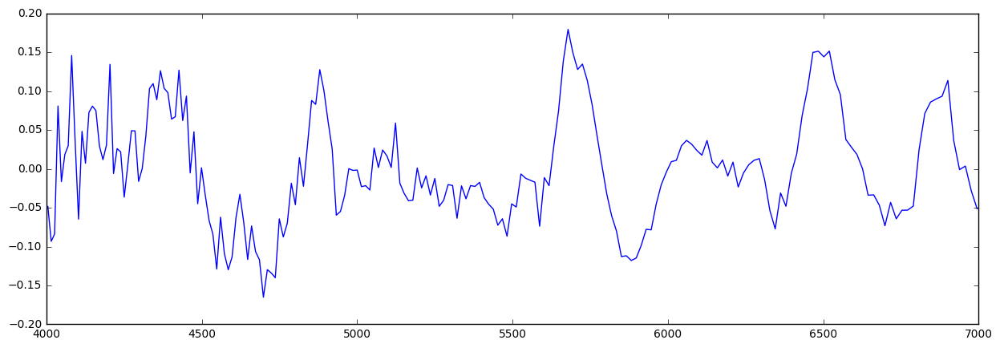

In [120]:
f=plt.figure(figsize=(15,5))
plt.plot(wavelengths,vv)

# ICA

In [604]:
spectra_pca_matrix.shape

(95, 95)

In [605]:
cov = np.cov(spectra_pca_matrix.T)
off_diag = []
diag = []
for i in range(cov.shape[0]):
    for j in range(cov.shape[1]):
        if i==j: 
            diag.append(cov[i,j])
        else:
            off_diag.append(cov[i,j])
off_diag = np.array(off_diag)
diag = np.array(diag)

In [606]:
np.abs(off_diag).sum()

1.5687872233473598e-12

In [607]:
spectra_pca_matrix.shape

(95, 95)

In [608]:
n_pca_dim = 95
spectra_matrix_pca_white = spectra_pca_matrix[:,0:n_pca_dim]


In [609]:
pca_eigs = pca.explained_variance_[0:n_pca_dim]

In [610]:
spectra_matrix_pca_white = spectra_matrix_pca_white/pca_eigs

In [611]:
from sklearn.decomposition import FastICA

In [612]:
n_ica_comp = 95
ica = FastICA(n_components=n_ica_comp)
ica_spec_matrix = ica.fit_transform(spectra_matrix_pca_white)

In [613]:
ica_spec_matrix.shape

(95, 95)

In [614]:
ica.components_.shape

(95, 95)

(x,y) shape is (95,95)
(x,y) shape is (95,95)
(x,y) shape is (95,95)
(x,y) shape is (95,95)
(x,y) shape is (95,95)
(x,y) shape is (95,95)
(x,y) shape is (95,95)
(x,y) shape is (95,95)
(x,y) shape is (95,95)
(x,y) shape is (95,95)


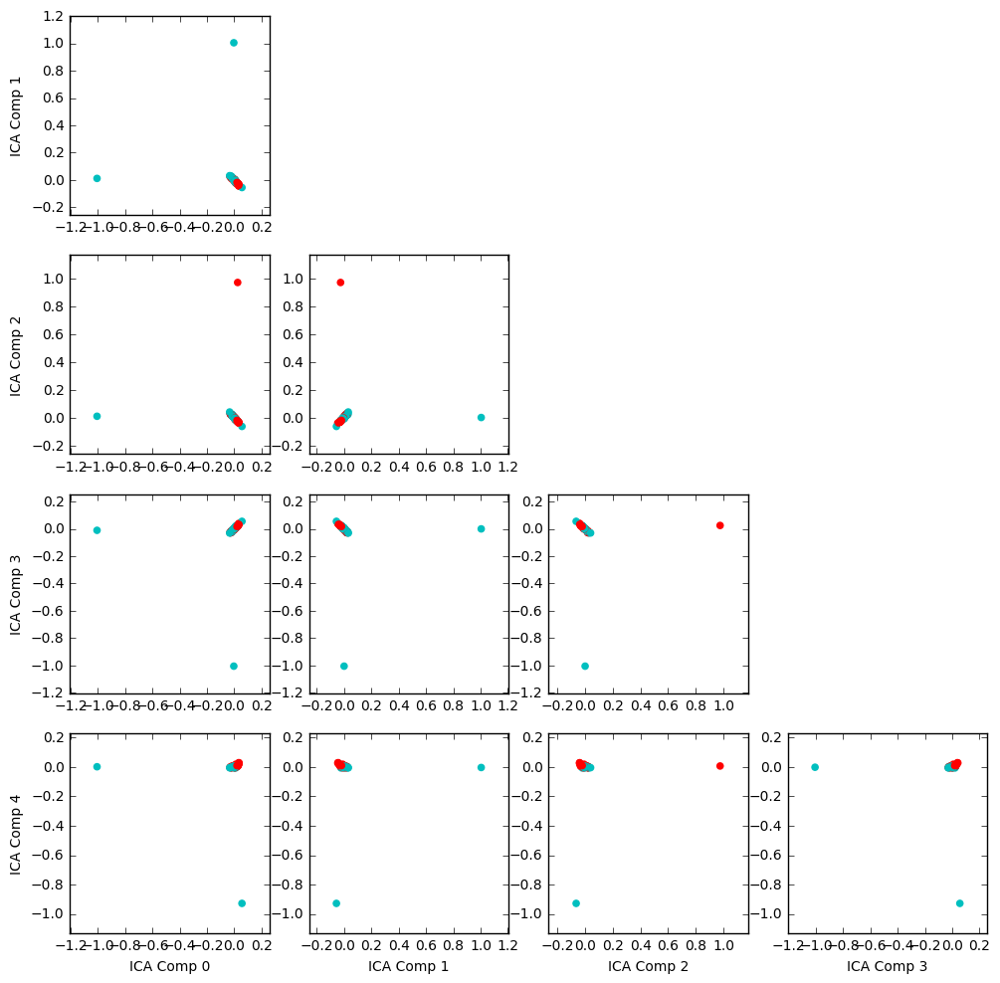

In [615]:
ica_dim = 5
plt.figure(j, figsize=(15, 15))
for i in range(ica_dim):
    for j in range(ica_dim):
        if i > j:
            plot_number = ica_dim*i+j+1
            plt.subplot(ica_dim,ica_dim,plot_number)
            x = ica_spec_matrix[:,i]
            y = ica_spec_matrix[:,j]
            print "(x,y) shape is (%d,%d)"%(len(x),len(y))
            plt.scatter(y,x,color=colors)
            plt.xlim((np.min(ica_spec_matrix[:,j])-.2,np.max(ica_spec_matrix[:,j])+.2))
            plt.ylim((np.min(ica_spec_matrix[:,i])-.2,np.max(ica_spec_matrix[:,i])+.2))
            #plt.xlim((-5,5))
            #plt.ylim((-5,5))
            if j==0:
                plt.ylabel('ICA Comp %d'%(i))
            if i==4:
                plt.xlabel('ICA Comp %d'%(j))

spectra matrix  (95, 207)
ica evecs  (95, 95)
spectra true  (207,)
ica_coeff  (95,)
ica coeff[:n]  (0,)
[]
ica evecs[:n]  (0, 95)
[]
arg  (95,)
inv ica coeff  [[ -1.07929819e-01  -1.97427015e-01  -2.89539375e-02  -1.18712664e-01
   -9.60827004e-01  -5.43749219e-01  -4.78963322e-01   6.84047041e-01
    6.97892077e-02   3.05756160e-01  -1.09650982e+00   3.61466965e-01
   -4.99911443e-01   7.64444075e-01   9.36488382e-01   4.96974135e-01
    6.59124859e-01   5.05316046e-01  -1.22321224e+00  -1.39797090e-01
    1.38177368e+00   1.99860306e+00   9.60324506e-01  -4.86684159e-02
    7.08497841e-01  -2.29090076e+00  -1.40566059e+00  -2.91784614e+00
   -2.00749933e+00   4.61717233e-01   1.42304914e+00   2.92050487e-01
   -8.86857057e-01  -1.59905063e+00  -1.80739644e+00   1.81583177e+00
    7.44689661e-01  -2.07735226e+00   1.70564201e+00  -1.19751029e+00
   -3.47963889e+00  -7.01964941e-01   1.77640083e+00   9.75371459e-01
    4.62318599e+00  -3.73584804e-02   5.80937885e-01  -1.93487945e+00
 

/home/data/mew488/virtualenvs/mypy2.7/lib/python2.7/site-packages/sklearn/utils/validation.py:395: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  DeprecationWarning)


ValueError: shapes (1,95) and (0,207) not aligned: 95 (dim 1) != 0 (dim 0)

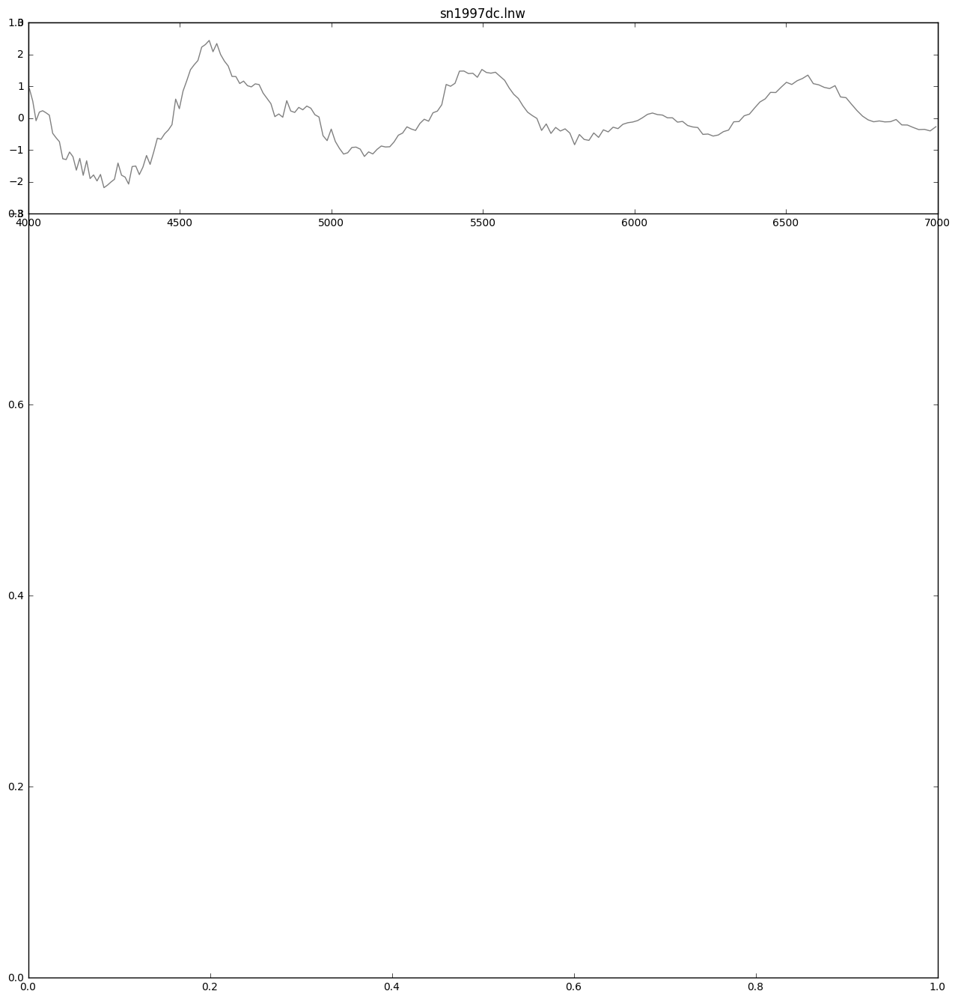

In [620]:
# Recreate 10 random spectra using the PCA decomposition
random_spec = np.random.randint(0,spectra_matrix.shape[0],1)
n_ica_components = [0,1,5,10,n_ica_comp]

ica_evecs = ica.components_.T

for j,spec in enumerate(random_spec):
    spec_name = Ib_Ic_names[spec]
    print 'spectra matrix ',spectra_matrix.shape
    true_spec = spectra_matrix[spec]
    
    print 'ica evecs ',ica_evecs.shape
    print 'spectra true ',spectra_matrix[spec].shape
    #ica_coeff = np.dot(ica_evecs, spectra_matrix_pca_white[spec])
    ica_coeff = ica_spec_matrix[spec]
    print 'ica_coeff ',ica_coeff.shape
    
    
    #------------------------------------------------------------
    # Plot the sequence of reconstructions
    fig = plt.figure(j, figsize=(15, 15))
    plt.title(spec_name)
    fig.subplots_adjust(hspace=0, top=0.95, bottom=0.1, left=0.12, right=0.93)

    for i, n in enumerate(n_ica_components):#, len(pca.components_)]):
        ax = fig.add_subplot(511 + i)
        ax.plot(wavelengths, true_spec, '-', c='gray')
        print 'ica coeff[:n] ',ica_coeff[:n].shape
        print ica_coeff[:n]
        print 'ica evecs[:n] ', ica_evecs[:n].shape
        print ica_evecs[:n]
        arg = np.dot(ica_coeff[:n], ica_evecs[:n])
        print 'arg ',arg.shape
        inv_ica_coeff = ica.inverse_transform(arg)
        print 'inv ica coeff ',inv_ica_coeff
        pca_from_ica_coeff = pca_eigs*inv_ica_coeff
        print pca_from_ica_coeff
        print 'pca from ica ',pca_from_ica_coeff.shape
        
        print 'evecs ', evecs.shape
        print 'mat mult: ',pca_from_ica_coeff.shape,evecs[:n_pca_dim].shape
        ax.plot(wavelengths, (np.dot(pca_from_ica_coeff, evecs[:n])).T, '-k')
        
        if i < 3:
            ax.xaxis.set_major_formatter(plt.NullFormatter())
            
        ax.set_ylim(-5, 5)
        ax.set_ylabel('flux')

        if n == 0:
            text = "mean"
        elif n == 1:
            text = "mean + 1 component\n"
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
        else:
            text = "mean + %i components\n" % n
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
            
        ax.text(0.02, 0.93, text, fontsize=20,ha='left', va='top', transform=ax.transAxes)

        fig.axes[-1].set_xlabel(r'${\rm wavelength\ (\AA)}$')

In [619]:
evecs[:0]

array([], shape=(0, 207), dtype=float64)

In [488]:
np.dot(spectra_matrix)

array([[  0.        ,   2.54536798,   2.45263803, ...,   1.26652602,
         -7.54670957,   0.76669039],
       [ -2.54536798,   0.        ,   2.75406394, ...,   4.11015555,
         -0.78691051,   6.22109681],
       [ -2.45263803,  -2.75406394,   0.        , ..., -10.19891052,
          2.55481422,   0.13107596],
       ..., 
       [ -1.26652602,  -4.11015555,  10.19891052, ...,   0.        ,
          0.20610881,   0.14847399],
       [  7.54670957,   0.78691051,  -2.55481422, ...,  -0.20610881,
          0.        ,  -0.03443815],
       [ -0.76669039,  -6.22109681,  -0.13107596, ...,  -0.14847399,
          0.03443815,   0.        ]])

## Kernel PCA

In [17]:
from sklearn.decomposition import KernelPCA

In [72]:
spectra_matrix
n_comp = 50

In [73]:
kpca = KernelPCA(kernel='rbf', fit_inverse_transform=True, n_components=n_comp)
k_dat = kpca.fit_transform(spectra_matrix)

In [75]:
kevecs = kpca.alphas_[0:n_comp]
kevals = kpca.lambdas_[0:n_comp]/np.sum(kpca.lambdas_)
kevals_cs = kevals.cumsum()



In [76]:
k_back_evecs = kpca.inverse_transform(kevecs)

In [77]:
k_back_evecs.shape

(50, 414)

In [78]:
print kevals_cs[10:20]
print evals_cs[10:20]

[ 0.5769039   0.59465683  0.61072274  0.62639106  0.64095084  0.6549047
  0.66833485  0.68161102  0.69465331  0.70738347]
[ 0.76518044  0.779341    0.79194409  0.80260677  0.81206388  0.82138326
  0.83023832  0.83810981  0.84531566  0.85226031]


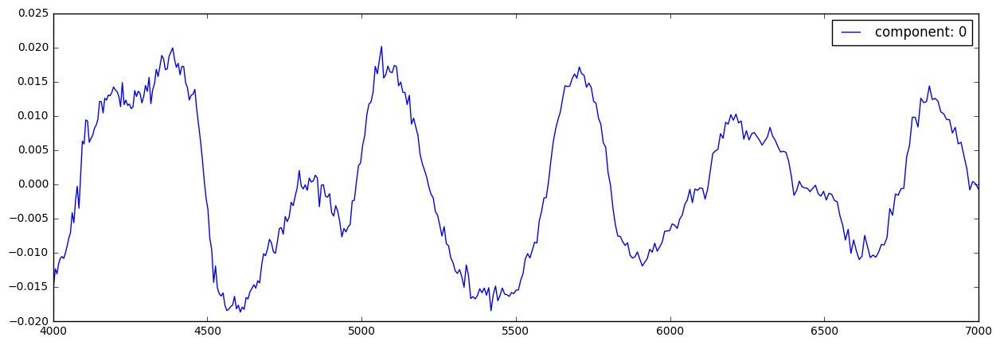

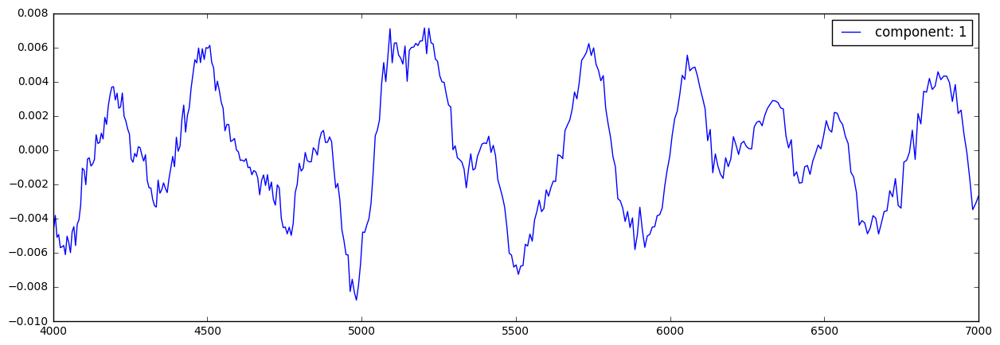

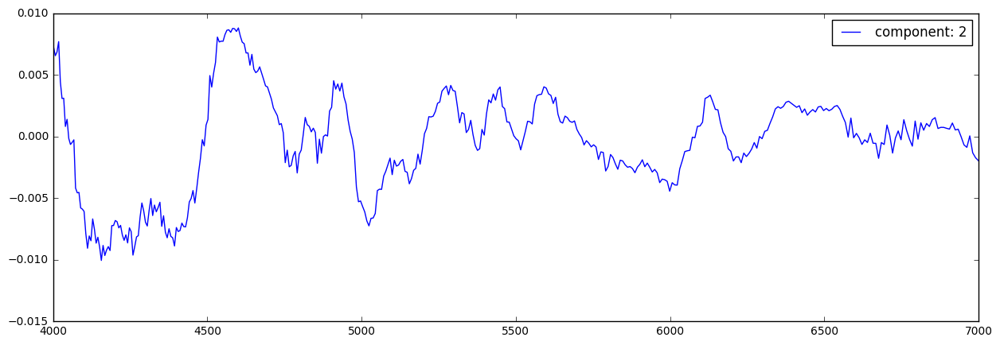

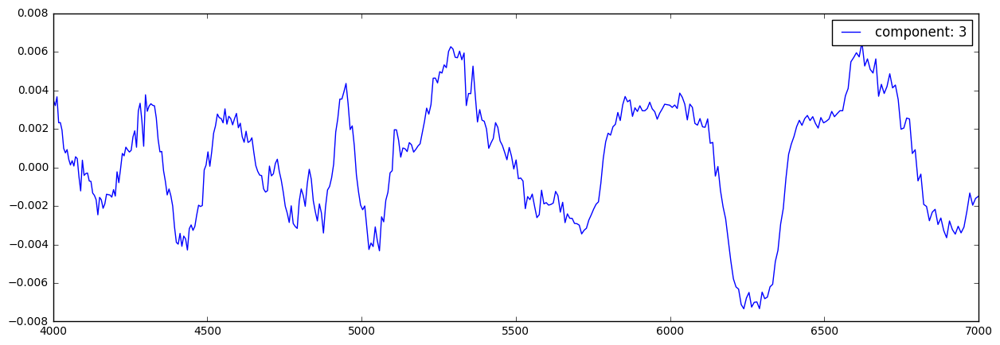

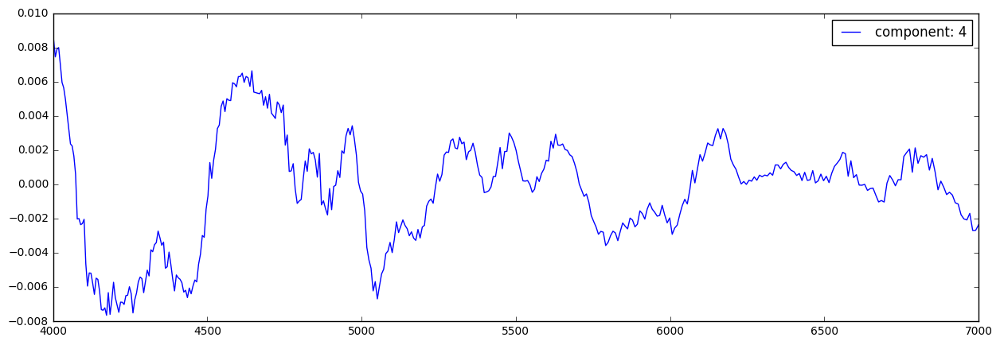

...

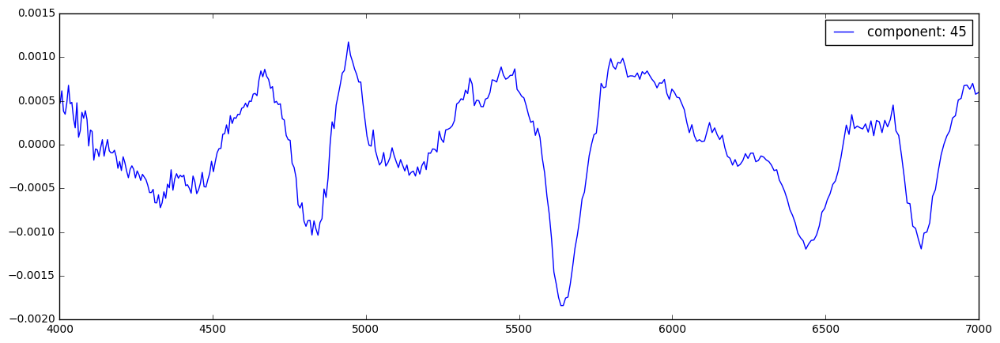

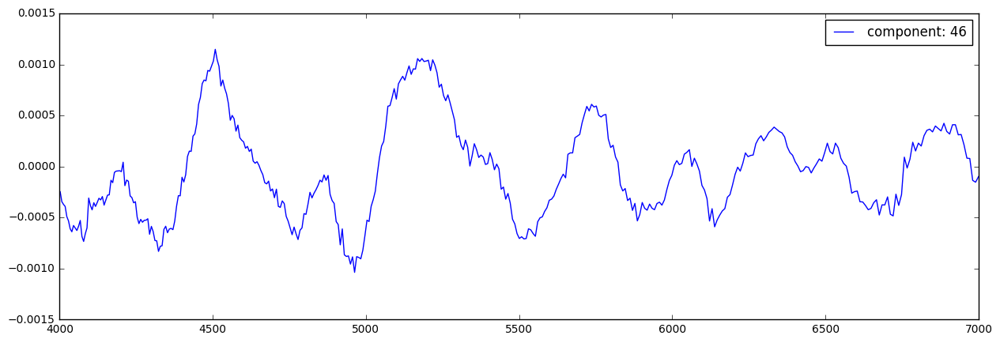

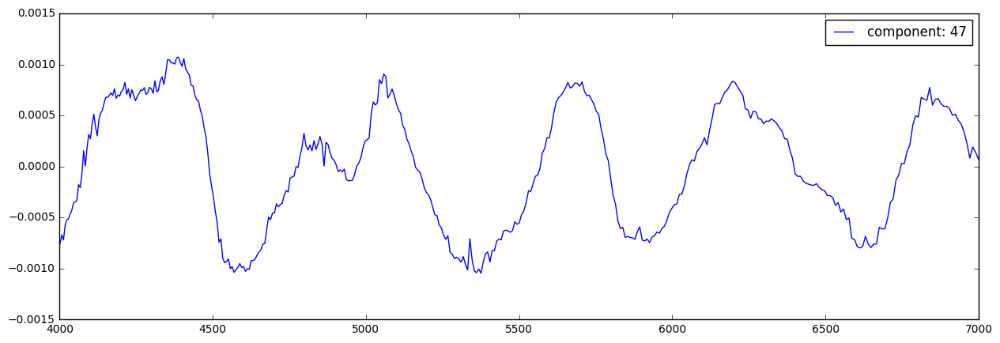

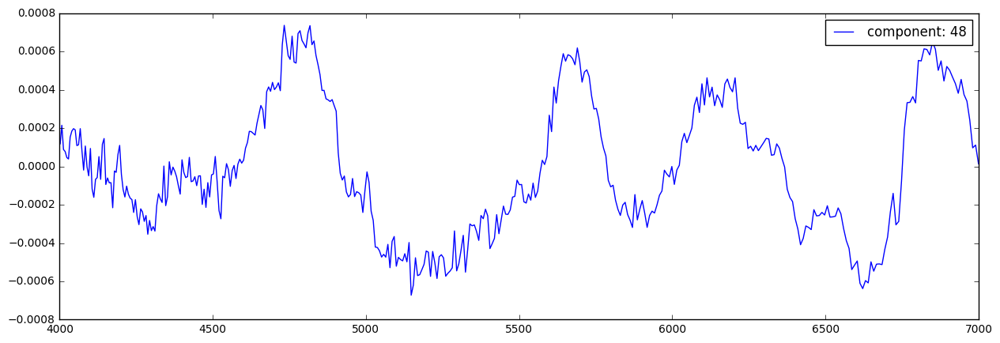

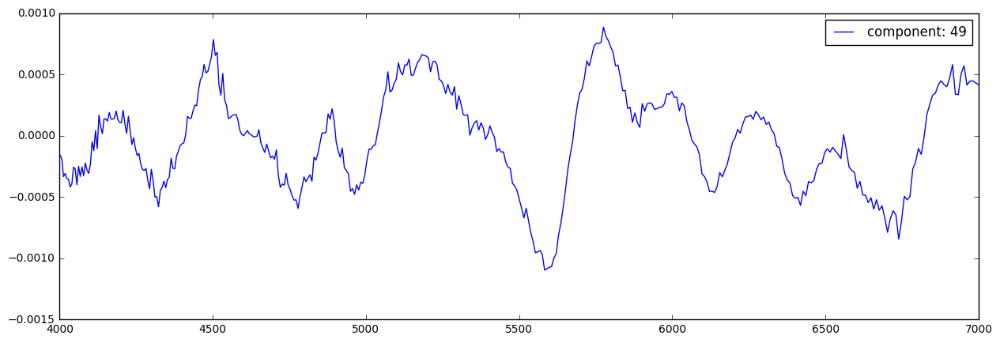

In [79]:
for i,kev in enumerate(k_back_evecs):
    plt.figure(figsize=(15,5))
    plt.plot(wavelengths,kevals[i]*(kev), label="component: %d"%i)
    plt.legend(fontsize=12)

In [54]:
spectra_pca_matrix.shape

(152, 46)

## Reconstruct Spectra using KPCA

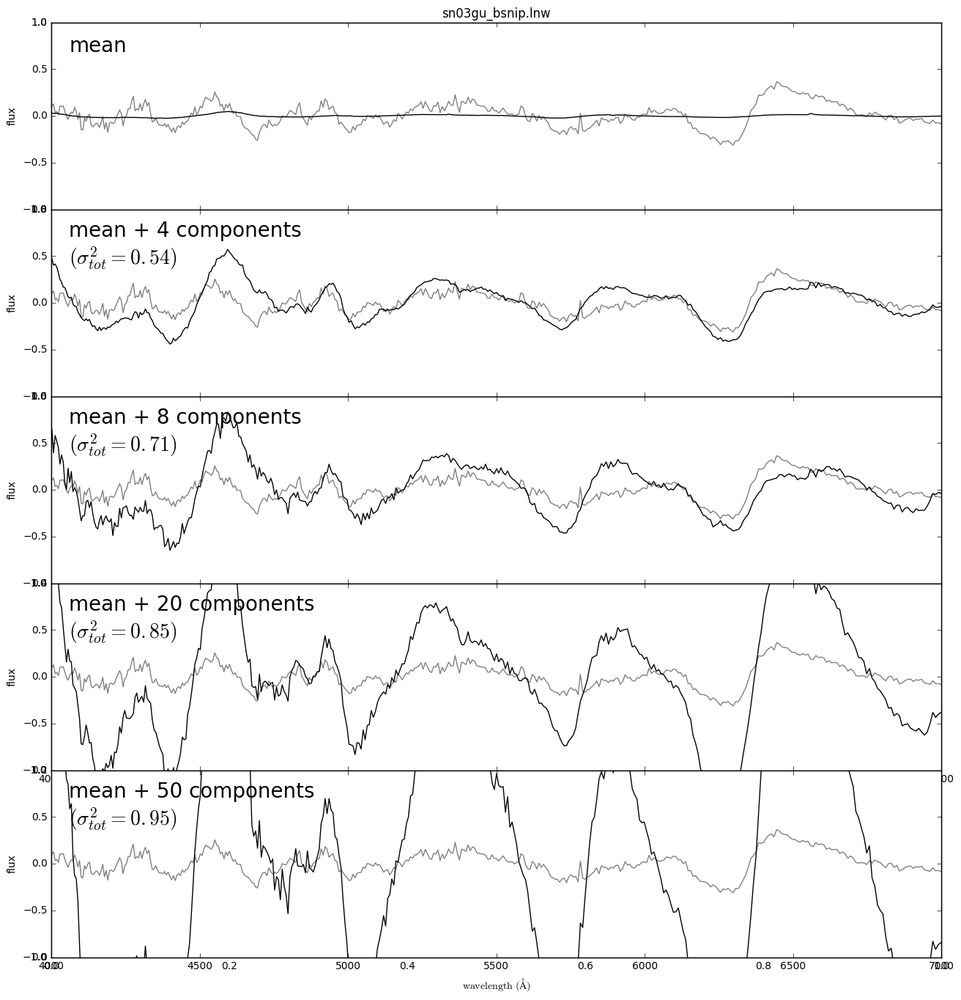

In [80]:
# Recreate 10 random spectra using the PCA decomposition
random_spec = np.random.randint(0,spectra_matrix.shape[0],1)
n_pca_components = [0,4,8,20,n_comp]

for j,spec in enumerate(random_spec):
    spec_name = Ib_Ic_names[spec]
    true_spec = (spectra_matrix[spec] + spectra_mean)*spectra_std
    
    pca_coeff = np.dot(k_back_evecs, spectra_matrix[spec])
    
    #------------------------------------------------------------
    # Plot the sequence of reconstructions
    fig = plt.figure(j, figsize=(15, 15))
    plt.title(spec_name)
    fig.subplots_adjust(hspace=0, top=0.95, bottom=0.1, left=0.12, right=0.93)

    for i, n in enumerate(n_pca_components):#, len(pca.components_)]):
        ax = fig.add_subplot(511 + i)
        ax.plot(wavelengths, true_spec, '-', c='gray')
        ax.plot(wavelengths, (spectra_mean + np.dot(pca_coeff[:n], k_back_evecs[:n]))*spectra_std, '-k')
        
        if i < 3:
            ax.xaxis.set_major_formatter(plt.NullFormatter())
            
        ax.set_ylim(-1, 1)
        ax.set_ylabel('flux')

        if n == 0:
            text = "mean"
        elif n == 1:
            text = "mean + 1 component\n"
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
        else:
            text = "mean + %i components\n" % n
            text += r"$(\sigma^2_{tot} = %.2f)$" % evals_cs[n - 1]
            
        ax.text(0.02, 0.93, text, fontsize=20,ha='left', va='top', transform=ax.transAxes)

        fig.axes[-1].set_xlabel(r'${\rm wavelength\ (\AA)}$')

In [122]:
a = 'sn2017ax.lnw'

In [125]:
a[:-4]

'sn2017ax'